<h1> Apparel Recommendations </h1>



In [2]:


from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [0]:

data = pd.read_json('tops_fashion.json')


In [0]:
print ('Number of data points : ', data.shape[0], \
       'Number of features/variables:', data.shape[1])

Number of data points :  183138 Number of features/variables: 19


In [0]:

data.columns 

Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')

Of these 19 features, we will be using only 6 features.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [0]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [0]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() 

Number of data points :  183138 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


### [5.1] Missing data for various features.

####  Basic stats for the feature: product_type_name

In [0]:

print(data['product_type_name'].describe())




count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [0]:

print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [0]:

product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

####  Basic stats for the feature: brand

In [0]:

print(data['brand'].describe())



count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [0]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

####  Basic stats for the feature: color

In [0]:

print(data['color'].describe())




count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [0]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

####  Basic stats for the feature: formatted_price

In [0]:
 
print(data['formatted_price'].describe())



count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [0]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

#### Basic stats for the feature: title


In [0]:
print(data['title'].describe())



count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [0]:
data.to_pickle('pickels/180k_apparel_data')

In [0]:
data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 28395


In [0]:

data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 28385


In [0]:
data.to_pickle('pickels/28k_apparel_data')

In [0]:

from PIL import Image
import requests
from io import BytesIO

for index, row in images.iterrows():
        url = row['large_image_url']
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img.save('images/28k_images/'+row['asin']+'.jpeg')




"\nfrom PIL import Image\nimport requests\nfrom io import BytesIO\n\nfor index, row in images.iterrows():\n        url = row['large_image_url']\n        response = requests.get(url)\n        img = Image.open(BytesIO(response.content))\n        img.save('workshop/images/28k_images/'+row['asin']+'.jpeg')\n\n\n"

### [5.2] Remove near duplicate items

#### [5.2.1] Understand about duplicates.

In [0]:

data = pd.read_pickle('pickels/28k_apparel_data')


print(sum(data.duplicated('title')))



2325


#### [5.2.2] Remove duplicates : Part 1

In [0]:

data = pd.read_pickle('pickels/28k_apparel_data')

In [0]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [0]:

data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 27949


In [0]:

data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
61973,B06Y1KZ2WB,Éclair,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,Éclair Women's Printed Thin Strap Blouse Black...,$24.99
133820,B010RV33VE,xiaoming,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Womens Sleeveless Loose Long T-shirts...,$18.19
81461,B01DDSDLNS,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Women's White Long Sleeve Single Brea...,$21.58
75995,B00X5LYO9Y,xiaoming,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,$15.91
151570,B00WPJG35K,xiaoming,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,$14.32


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [0]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [0]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

   
    a = data['title'].loc[indices[i]].split()


    j = i+1
    while j < num_data_points:

        
        b = data['title'].loc[indices[j]].split()


        length = max(len(a), len(b))

       
        count  = 0

      
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        
        if (length - count) > 2:
            
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])

           
            if j == num_data_points-1: stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[j]])

           
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [0]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the duplicates which differ only at the end.

In [0]:
print('Number of data points : ', data.shape[0])

Number of data points :  17593


In [0]:
data.to_pickle('pickels/17k_apperal_data')

#### [5.2.3] Remove duplicates : Part 2

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [0]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [0]:

indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
   
    a = data['title'].loc[i].split()
  
    for j in indices:
        
        b = data['title'].loc[j].split()
       
        
        length = max(len(a),len(b))
        
       
        count  = 0

        
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        
        if (length - count) < 3:
            indices.remove(j)

In [0]:

data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [0]:
print('Number of data points after stage two of dedupe: ',data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16042


In [0]:
data.to_pickle('pickels/16k_apperal_data')


# 6. Text pre-processing

In [0]:
data = pd.read_pickle('pickels/16k_apperal_data')



In [0]:

stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            .
            word = ("".join(e for e in words if e.isalnum()))
            
            word = word.lower()
           
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'such', 'and', 'hers', 'up', 'she', 'd', 'further', 'all', 'than', 'under', 'is', 'off', 'both', 'most', 'few', 'should', 're', 'very', 'just', 'then', 'didn', 'myself', 'in', 'too', 's', 'shouldn', 'herself', 'because', 'how', 'itself', 'what', 'shan', 'weren', 'doing', 'them', 'couldn', 'their', 'so', 'ain', 'haven', 'yourself', 'now', 'll', 'isn', 'about', 'over', 'into', 'before', 'during', 'on', 'as', 'aren', 'against', 'above', 'down', 'they', 'below', 'me', 'again', 'for', 'why', 'been', 'yourselves', 'more', 'her', 'that', 'can', 'am', 'was', 'themselves', 'mightn', 'does', 'those', 'only', 'hasn', 'any', 'ma', 'are', 'nor', 'out', 'you', 'ourselves', 'the', 'an', 'has', 'where', 'i', 'while', 'ours', 'its', 'your', 'had', 'were', 'being', 'no', 'or', 'needn', 've', 'y', 'a', 'each', 'have', 'through', 'when', 'mustn', 'by', 'won', 'from', 'own', 'will', 'there', 't', 'him', 'these', 'doesn', 'theirs', 'my', 'did', 'of', 'who', 'until', 'wouldn', 'we', 'do'

In [0]:
start_time = time.clock()

for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')

print(time.clock() - start_time, "seconds")

3.5727220000000006 seconds


In [0]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [0]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

## Stemming 

In [0]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))





argu
fish


# [8] Text based product similarity

In [3]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [4]:



#Display an image
def display_img(url,ax,fig):
    
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    
    plt.imshow(img)
  

def plot_heatmap(keys, values, labels, url, text):
        
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        
        ax = plt.subplot(gs[0])
        
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) 
        ax.set_title(text) 
        
       
        ax = plt.subplot(gs[1])
        
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        
        display_img(url, ax, fig)
        
        
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    

    
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    
    keys = list(vec2.keys())
    
    values = [vec2[x] for x in vec2.keys()]
    
    

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
           
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)



def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    
    return Counter(words)


def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## [8.2] Bag of Words (BoW) on product titles.

In [0]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.



(16042, 12609)

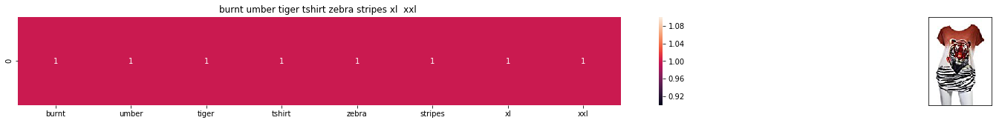

ASIN : B00JXQB5FQ
Brand: Si Row
Title: burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean similarity with the query image : 0.0


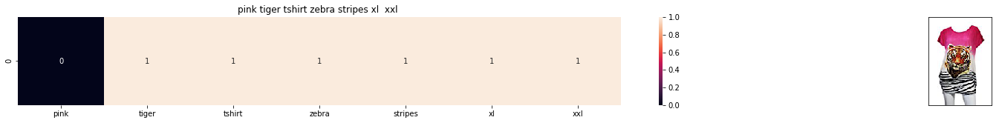

ASIN : B00JXQASS6
Brand: Si Row
Title: pink tiger tshirt zebra stripes xl  xxl 
Euclidean similarity with the query image : 1.73205080757


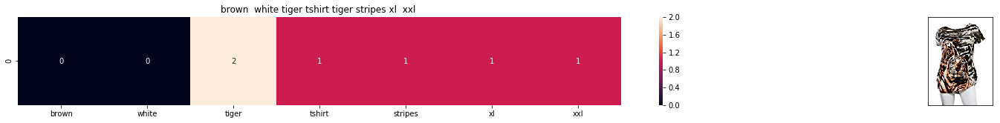

ASIN : B00JXQCWTO
Brand: Si Row
Title: brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean similarity with the query image : 2.44948974278


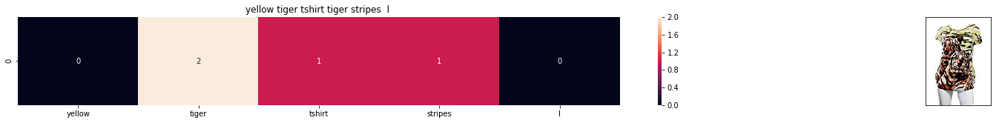

ASIN : B00JXQCUIC
Brand: Si Row
Title: yellow tiger tshirt tiger stripes  l 
Euclidean similarity with the query image : 2.64575131106


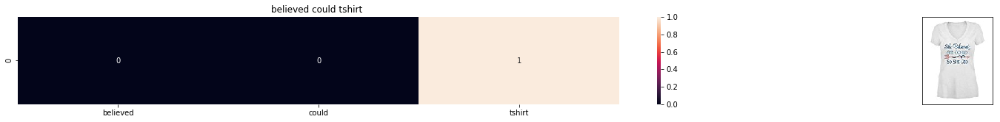

ASIN : B07568NZX4
Brand: Rustic Grace
Title: believed could tshirt 
Euclidean similarity with the query image : 3.0


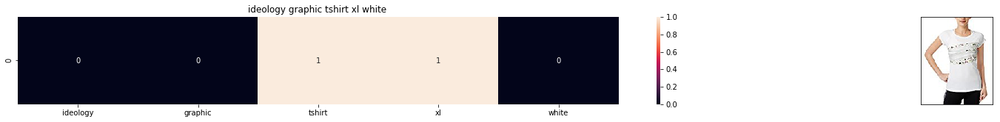

ASIN : B01NB0NKRO
Brand: Ideology
Title: ideology graphic tshirt xl white 
Euclidean similarity with the query image : 3.0


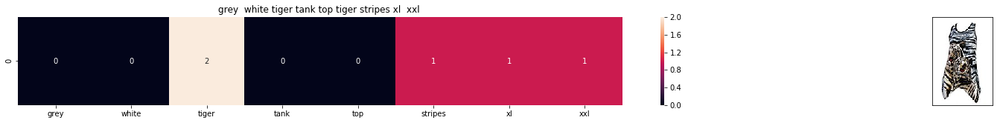

ASIN : B00JXQAFZ2
Brand: Si Row
Title: grey  white tiger tank top tiger stripes xl  xxl 
Euclidean similarity with the query image : 3.0


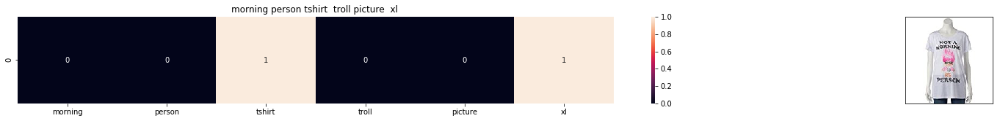

ASIN : B01CLS8LMW
Brand: Awake
Title: morning person tshirt  troll picture  xl 
Euclidean similarity with the query image : 3.16227766017


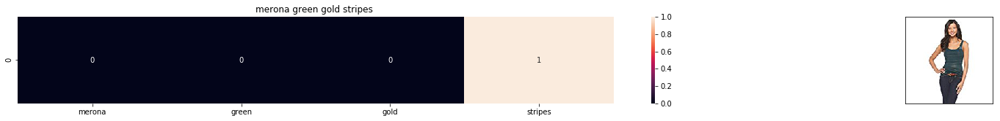

ASIN : B01KVZUB6G
Brand: Merona
Title: merona green gold stripes 
Euclidean similarity with the query image : 3.16227766017


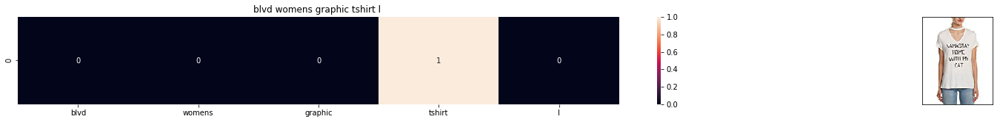

ASIN : B0733R2CJK
Brand: BLVD
Title: blvd womens graphic tshirt l 
Euclidean similarity with the query image : 3.16227766017


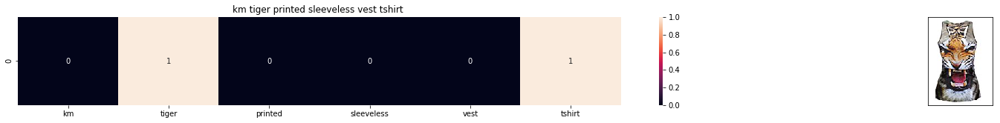

ASIN : B012VQLT6Y
Brand: KM T-shirt
Title: km tiger printed sleeveless vest tshirt 
Euclidean similarity with the query image : 3.16227766017


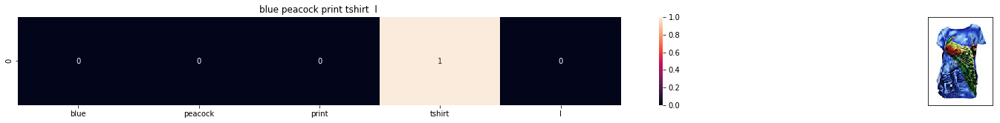

ASIN : B00JXQC8L6
Brand: Si Row
Title: blue peacock print tshirt  l 
Euclidean similarity with the query image : 3.16227766017


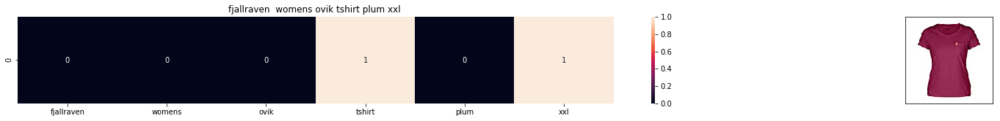

ASIN : B06XC3CZF6
Brand: Fjallraven
Title: fjallraven  womens ovik tshirt plum xxl 
Euclidean similarity with the query image : 3.16227766017


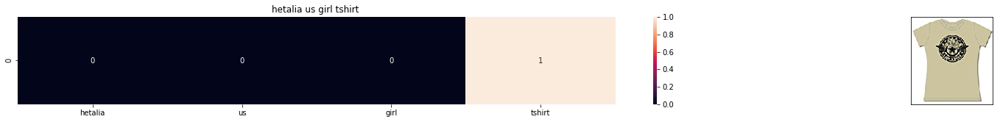

ASIN : B005IT8OBA
Brand: Hetalia
Title: hetalia us girl tshirt 
Euclidean similarity with the query image : 3.16227766017


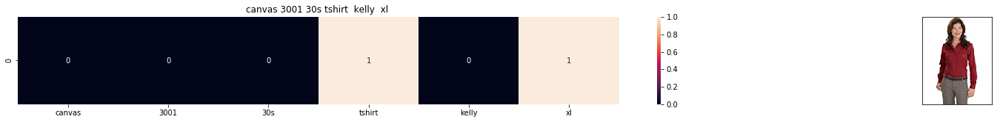

ASIN : B0088PN0LA
Brand: Red House
Title: canvas 3001 30s tshirt  kelly  xl 
Euclidean similarity with the query image : 3.16227766017


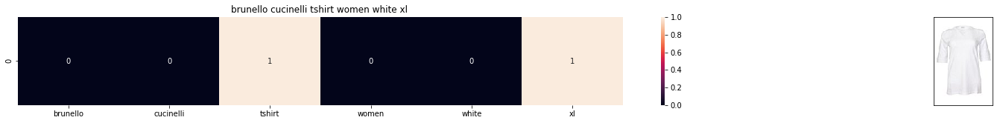

ASIN : B06X99V6WC
Brand: Brunello Cucinelli
Title: brunello cucinelli tshirt women white xl 
Euclidean similarity with the query image : 3.16227766017


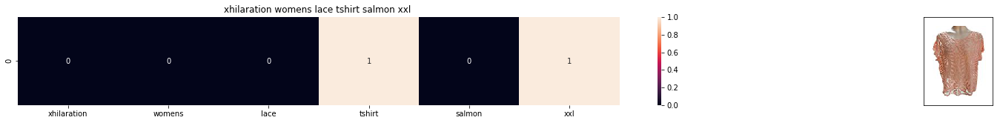

ASIN : B06Y1JPW1Q
Brand: Xhilaration
Title: xhilaration womens lace tshirt salmon xxl 
Euclidean similarity with the query image : 3.16227766017


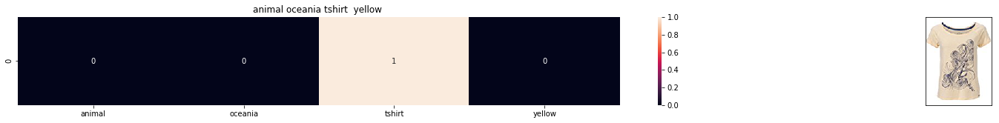

ASIN : B06X6GX6WG
Brand: Animal
Title: animal oceania tshirt  yellow 
Euclidean similarity with the query image : 3.16227766017


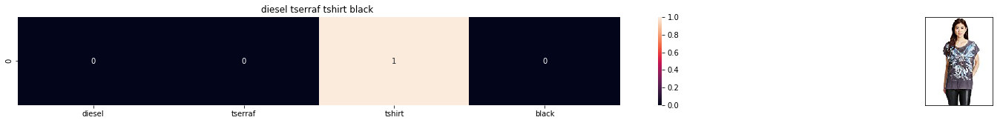

ASIN : B017X8PW9U
Brand: Diesel
Title: diesel tserraf tshirt black 
Euclidean similarity with the query image : 3.16227766017


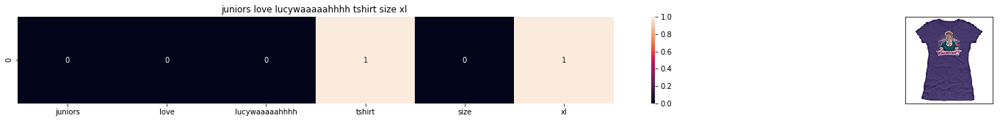

ASIN : B00IAA4JIQ
Brand: I Love Lucy
Title: juniors love lucywaaaaahhhh tshirt size xl 
Euclidean similarity with the query image : 3.16227766017


In [0]:
def bag_of_words_model(doc_id, num_results):
   
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
       
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

bag_of_words_model(12566, 20) 

## [8.5] TF-IDF based product similarity

In [0]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])


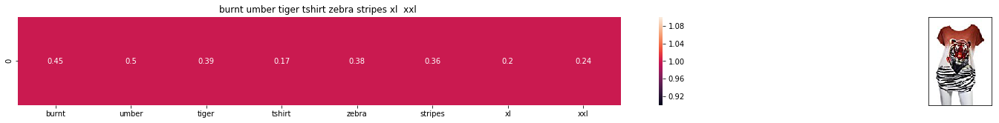

ASIN : B00JXQB5FQ
BRAND : Si Row
Eucliden distance from the given image : 0.0


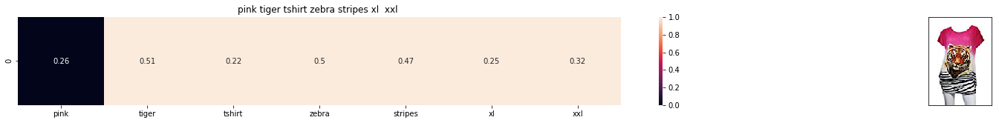

ASIN : B00JXQASS6
BRAND : Si Row
Eucliden distance from the given image : 0.753633191245


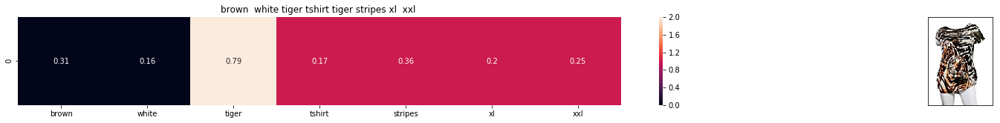

ASIN : B00JXQCWTO
BRAND : Si Row
Eucliden distance from the given image : 0.935764394377


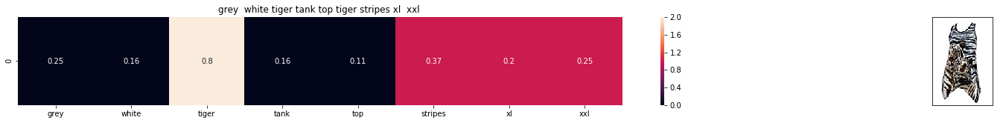

ASIN : B00JXQAFZ2
BRAND : Si Row
Eucliden distance from the given image : 0.95861535242


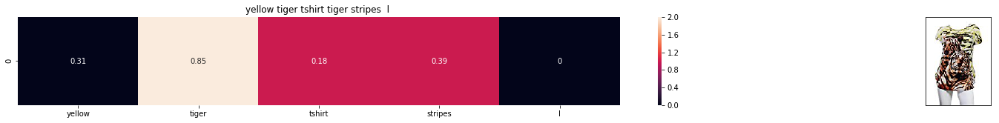

ASIN : B00JXQCUIC
BRAND : Si Row
Eucliden distance from the given image : 1.00007496145


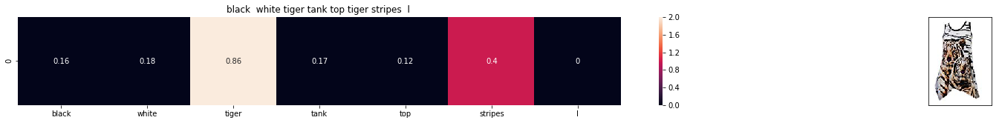

ASIN : B00JXQAO94
BRAND : Si Row
Eucliden distance from the given image : 1.02321555246


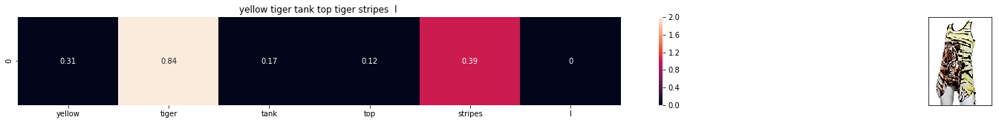

ASIN : B00JXQAUWA
BRAND : Si Row
Eucliden distance from the given image : 1.0319918463


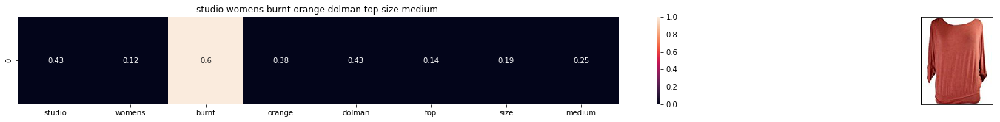

ASIN : B06XSCVFT5
BRAND : Studio M
Eucliden distance from the given image : 1.21068436704


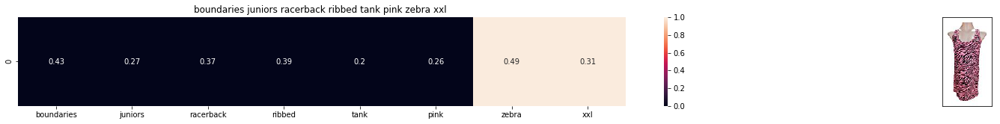

ASIN : B06Y2GTYPM
BRAND : No Boundaries
Eucliden distance from the given image : 1.21216838107


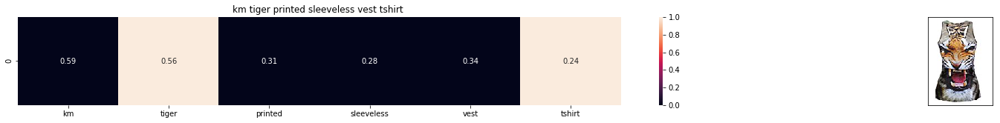

ASIN : B012VQLT6Y
BRAND : KM T-shirt
Eucliden distance from the given image : 1.21979064028


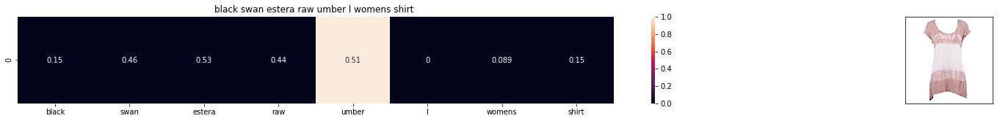

ASIN : B06Y1VN8WQ
BRAND : Black Swan
Eucliden distance from the given image : 1.220684966


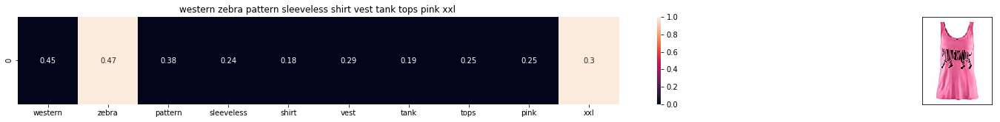

ASIN : B00Z6HEXWI
BRAND : Black Temptation
Eucliden distance from the given image : 1.22128139212


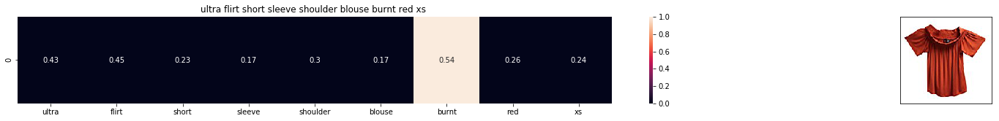

ASIN : B074TR12BH
BRAND : Ultra Flirt
Eucliden distance from the given image : 1.23133640946


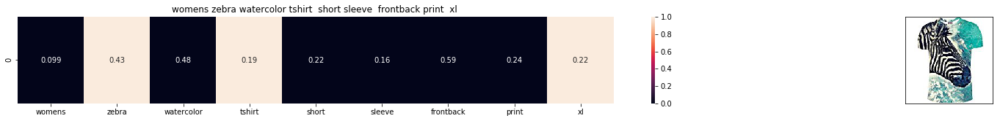

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
Eucliden distance from the given image : 1.23184519726


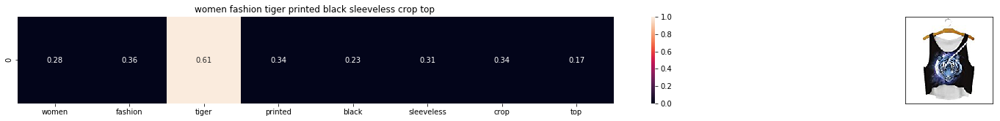

ASIN : B074T8ZYGX
BRAND : MKP Crop Top
Eucliden distance from the given image : 1.23406074574


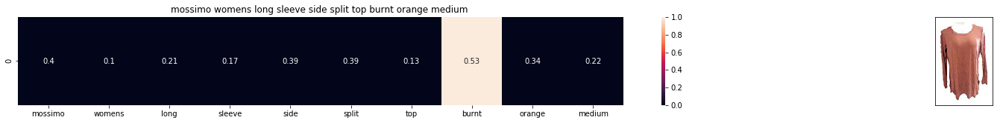

ASIN : B071ZDF6T2
BRAND : Mossimo
Eucliden distance from the given image : 1.23527855777


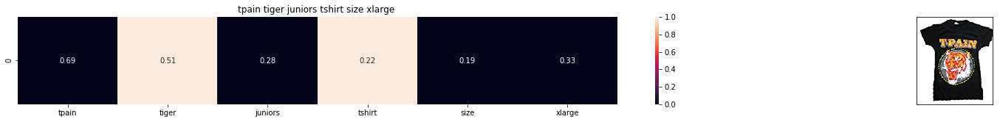

ASIN : B01K0H02OG
BRAND : Tultex
Eucliden distance from the given image : 1.23645729881


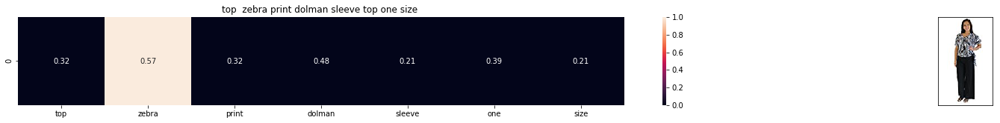

ASIN : B00H8A6ZLI
BRAND : Vivian's Fashions
Eucliden distance from the given image : 1.24996155053


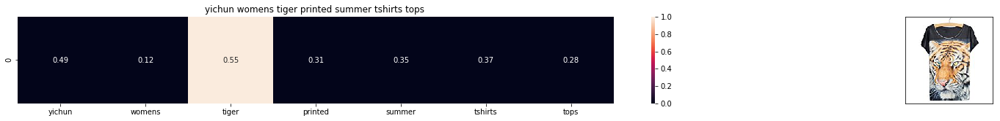

ASIN : B010NN9RXO
BRAND : YICHUN
Eucliden distance from the given image : 1.25354614209


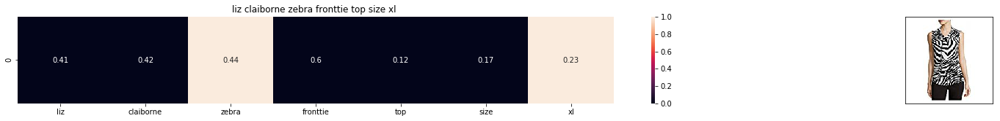

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
Eucliden distance from the given image : 1.25388329384


In [0]:
def tfidf_model(doc_id, num_results):
    
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

   
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(12566, 20)


## [8.5] IDF based product similarity

In [5]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])


In [6]:
def n_containing(word):
    
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    
    return math.log(data.shape[0] / (n_containing(word)))

In [7]:

idf_title_features  = idf_title_features.astype(np.float)

for i in idf_title_vectorizer.vocabulary_.keys():
   
    idf_val = idf(i)
    
    
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
       
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

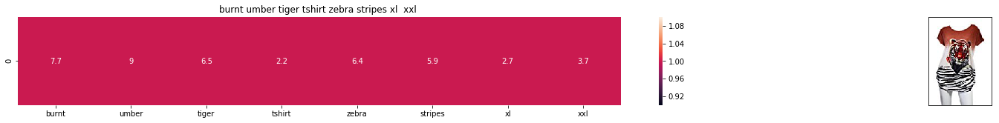

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from the given image : 0.0


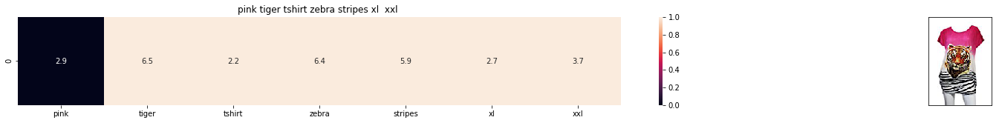

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from the given image : 12.2050713112


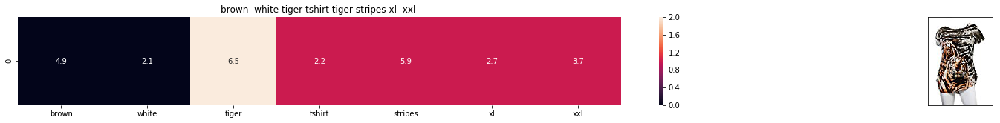

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from the given image : 14.4683626856


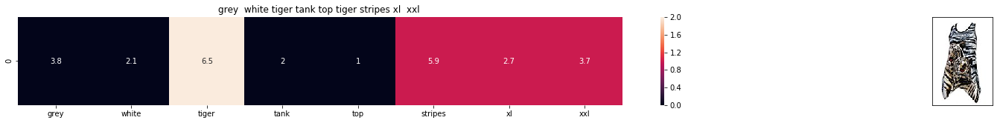

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from the given image : 14.4868329248


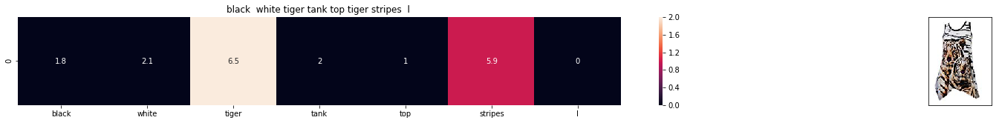

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from the given image : 14.8333929667


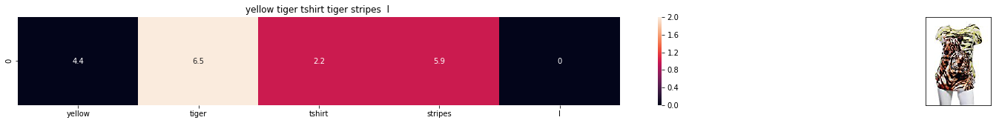

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from the given image : 14.8987445167


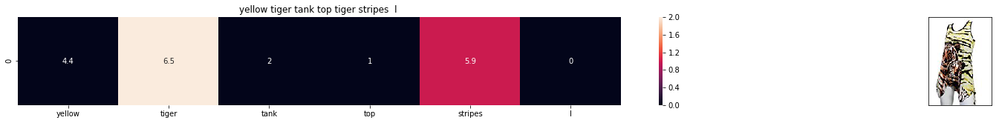

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from the given image : 15.2244582873


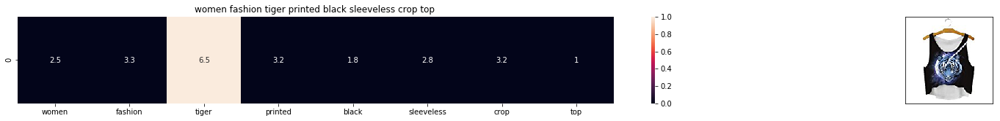

ASIN : B074T8ZYGX
Brand : MKP Crop Top
euclidean distance from the given image : 17.0808129556


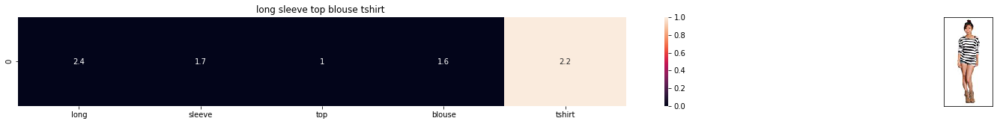

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 17.0901681256


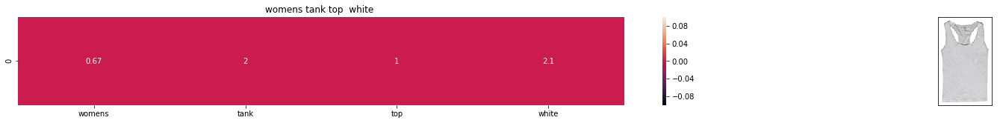

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 17.1532153376


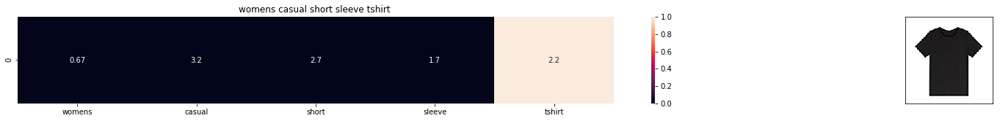

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 17.3367152387


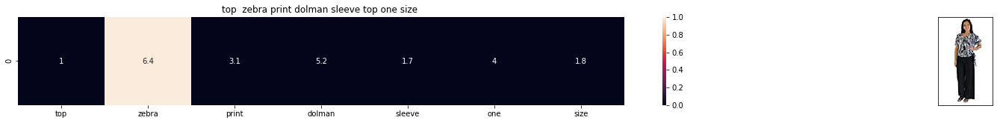

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from the given image : 17.410075941


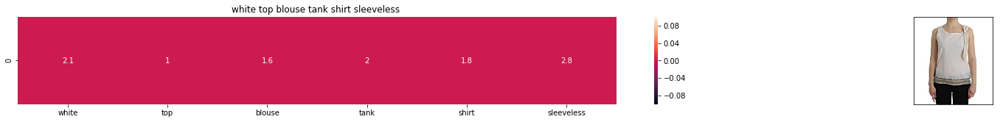

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 17.5399213355


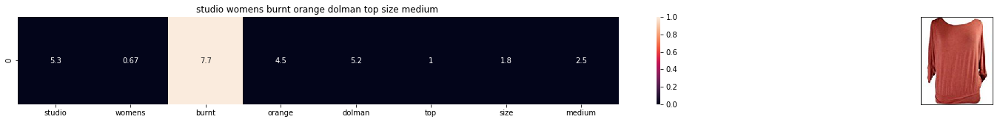

ASIN : B06XSCVFT5
Brand : Studio M
euclidean distance from the given image : 17.6127585437


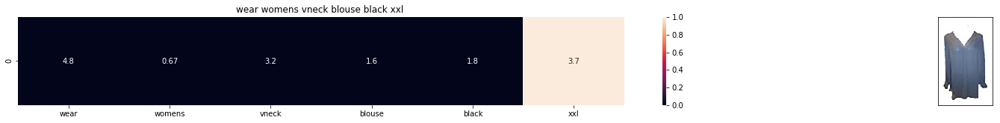

ASIN : B06Y6FH453
Brand : Who What Wear
euclidean distance from the given image : 17.6237452825


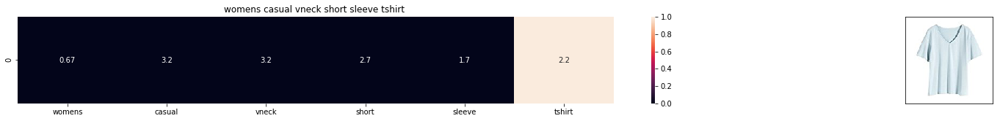

ASIN : B074V45DCX
Brand : Rain
euclidean distance from the given image : 17.6343424968


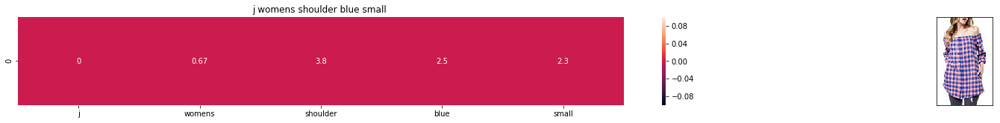

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 17.6375371274


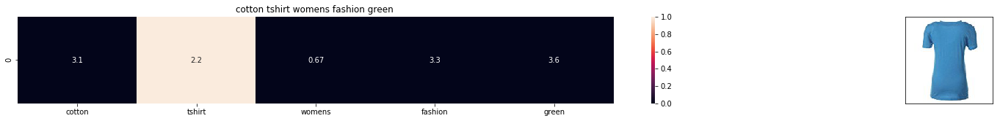

ASIN : B073GJGVBN
Brand : Ivan Levi
euclidean distance from the given image : 17.7230738913


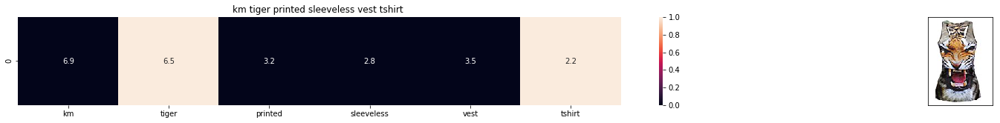

ASIN : B012VQLT6Y
Brand : KM T-shirt
euclidean distance from the given image : 17.7625885612


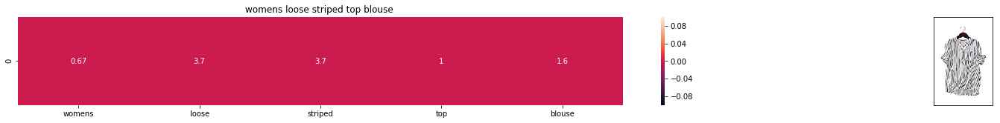

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
euclidean distance from the given image : 17.7795368647


In [0]:
def idf_model(doc_id, num_results):
    
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(12566,20)


# [9] Text Semantics based product similarity

In [0]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.


'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

In [11]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

# in this project we are using a pretrained model by google

model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)



with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [12]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
           
            vec.append(np.zeros(shape=(300,)))
    
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
   
    

    s1_vec = get_word_vec(sentence1, doc_id1, model)
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    ax.set_xticklabels(sentence2.split())
    ax.set_yticklabels(sentence1.split())
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [13]:

vocab = model.keys()

def build_avg_vec(sentence, num_features, doc_id, m_name):

    featureVec = np.zeros((num_features,), dtype="float32")
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    return featureVec

### [9.2] Average Word2Vec product similarity.

In [0]:
doc_id = 0
w2v_title = []
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

w2v_title = np.array(w2v_title)


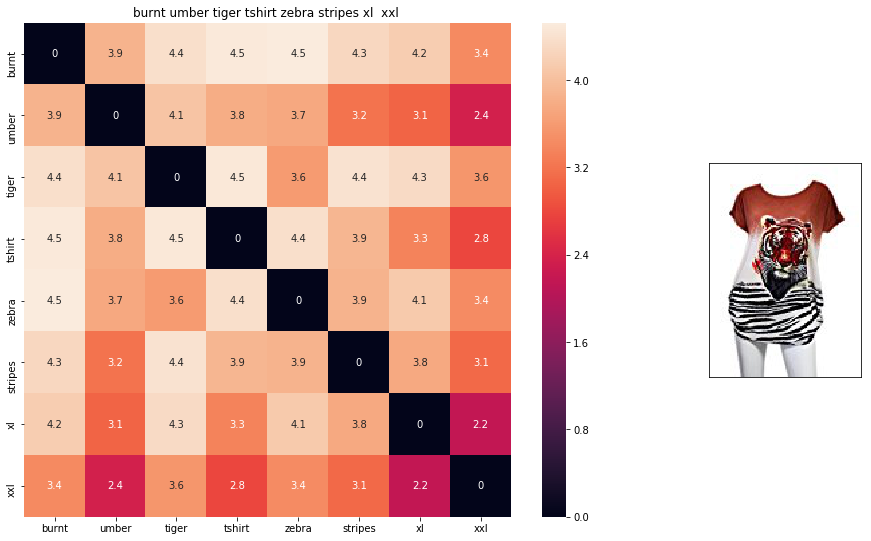

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.000690534


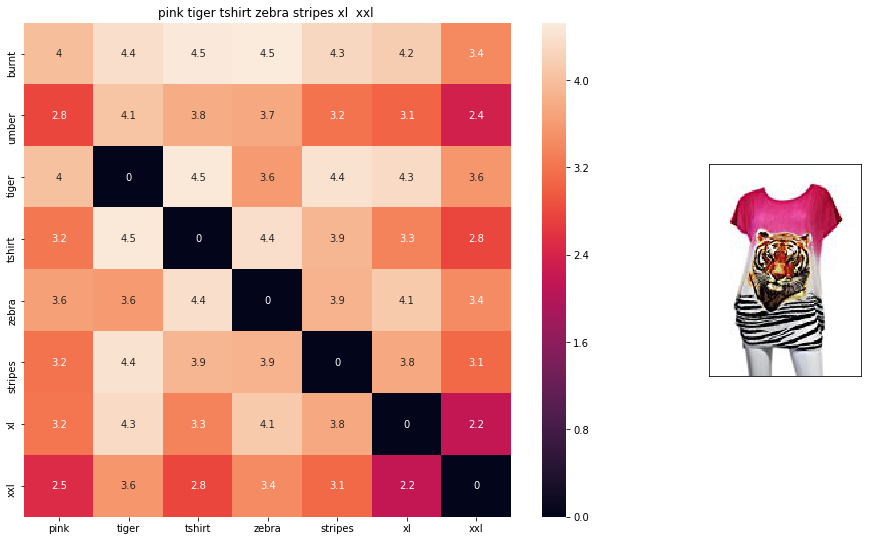

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 0.589193


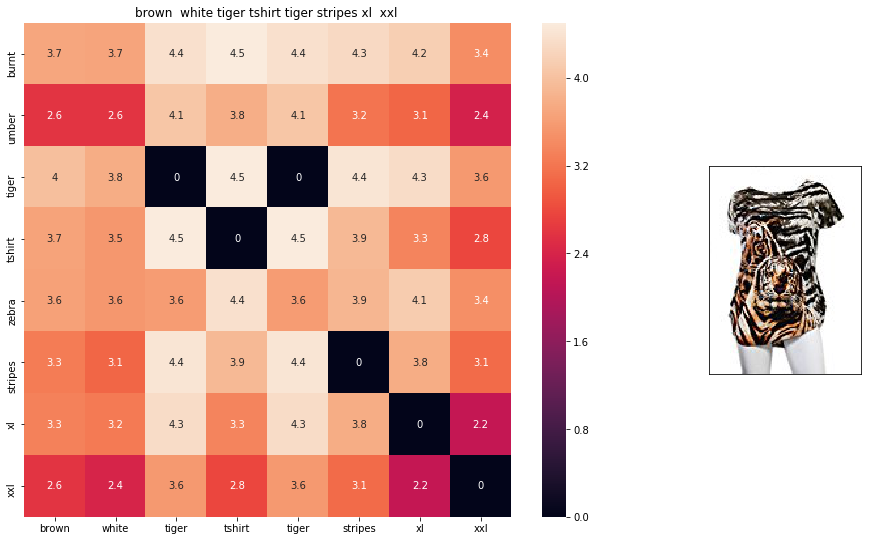

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 0.700344


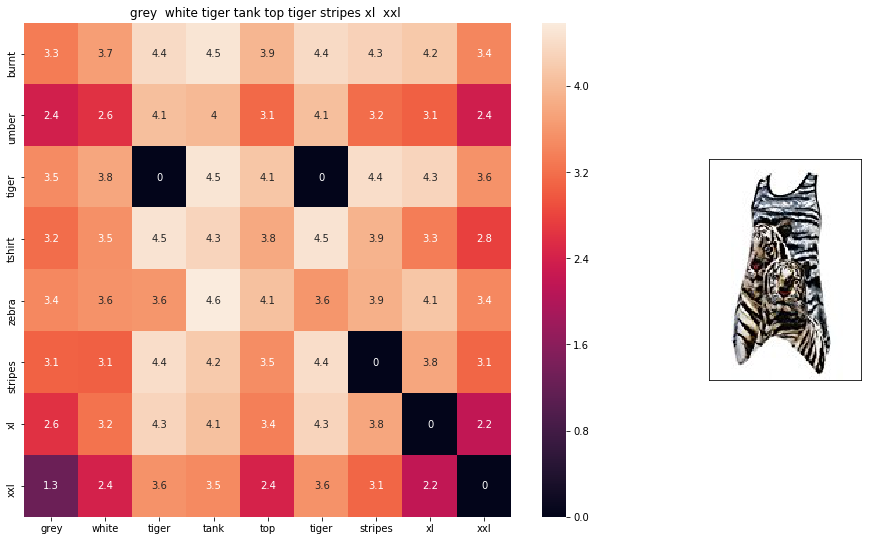

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 0.89284


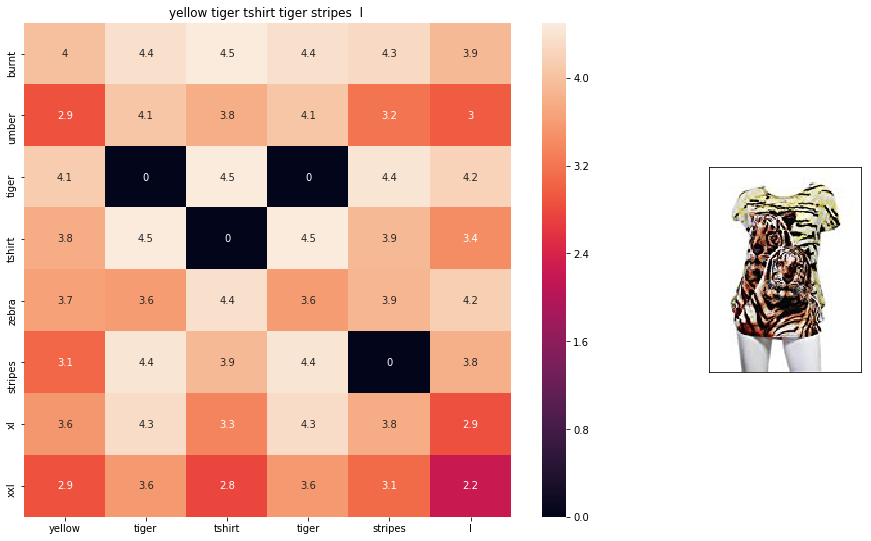

ASIN : B00JXQCUIC
BRAND : Si Row
euclidean distance from given input image : 0.956013


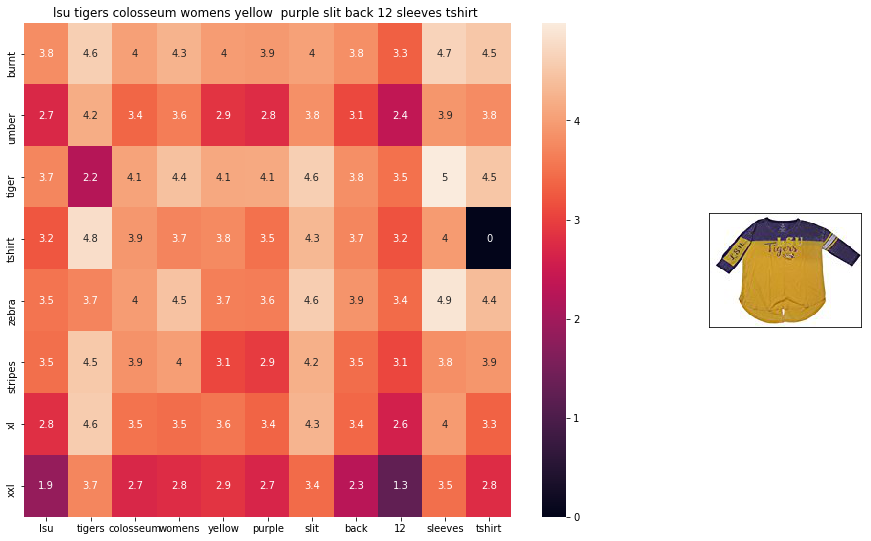

ASIN : B073R5Q8HD
BRAND : Colosseum
euclidean distance from given input image : 1.02297


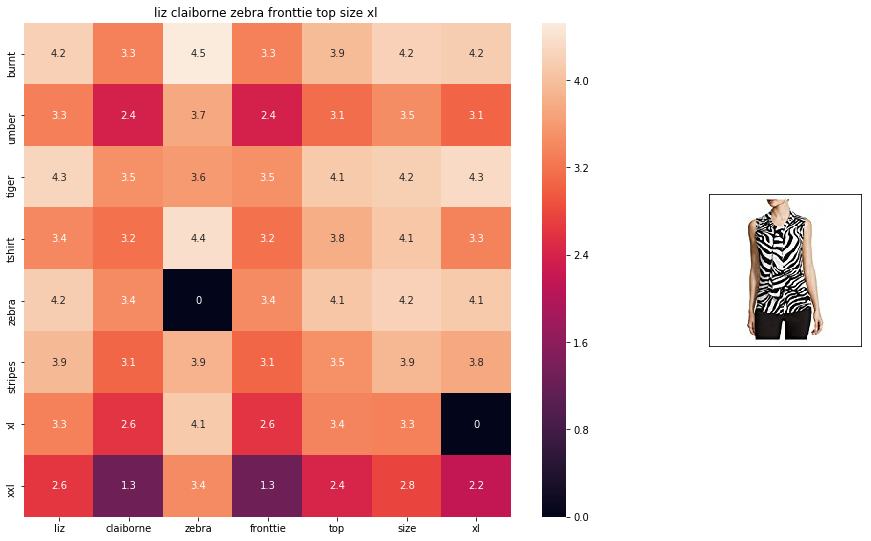

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
euclidean distance from given input image : 1.06693


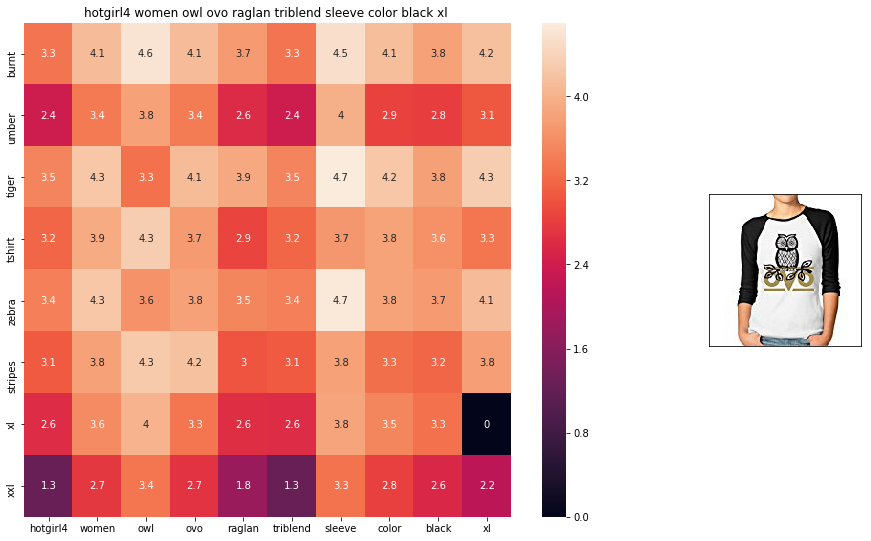

ASIN : B01L8L73M2
BRAND : Hotgirl4 Raglan Design
euclidean distance from given input image : 1.07314


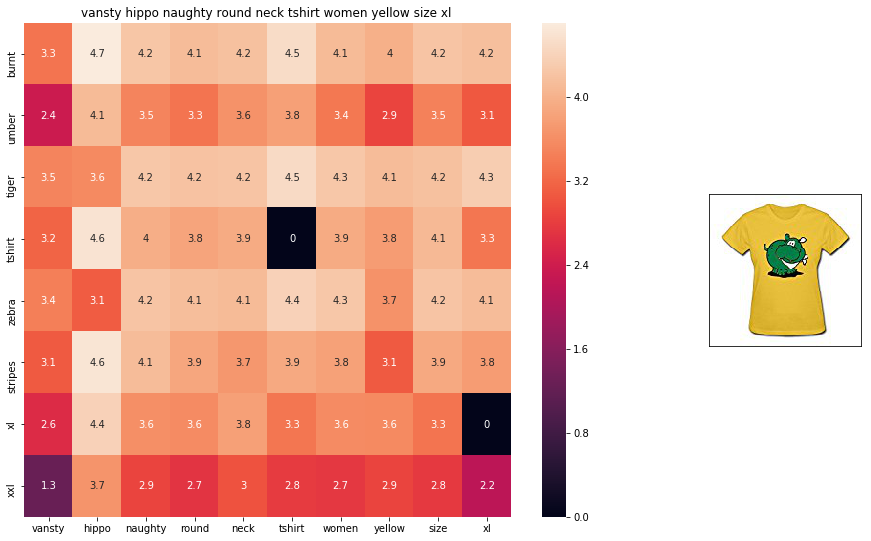

ASIN : B01EJS5H06
BRAND : Vansty
euclidean distance from given input image : 1.07572


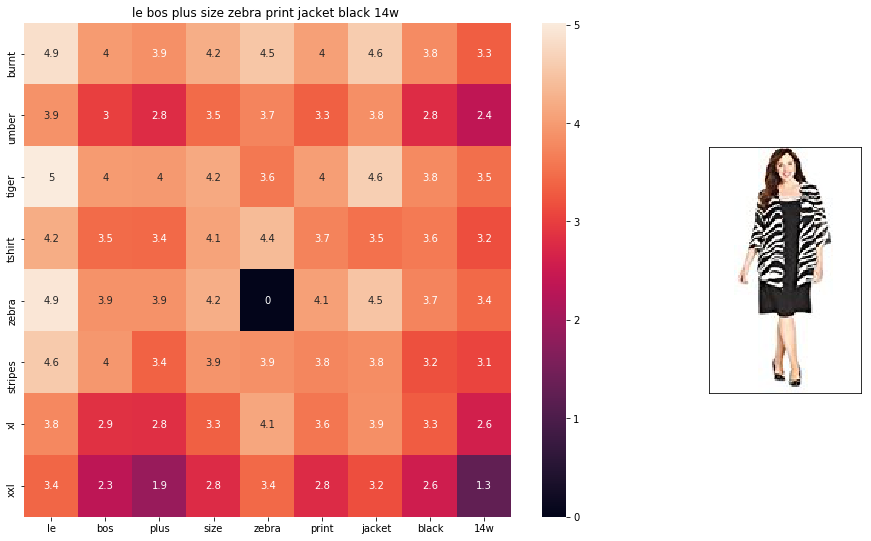

ASIN : B01BO1XRK8
BRAND : Le Bos
euclidean distance from given input image : 1.084


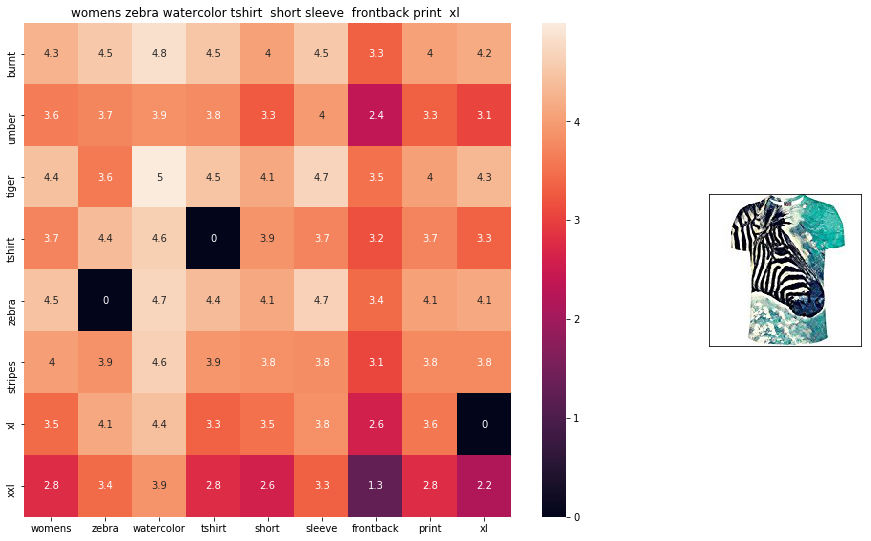

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
euclidean distance from given input image : 1.08422


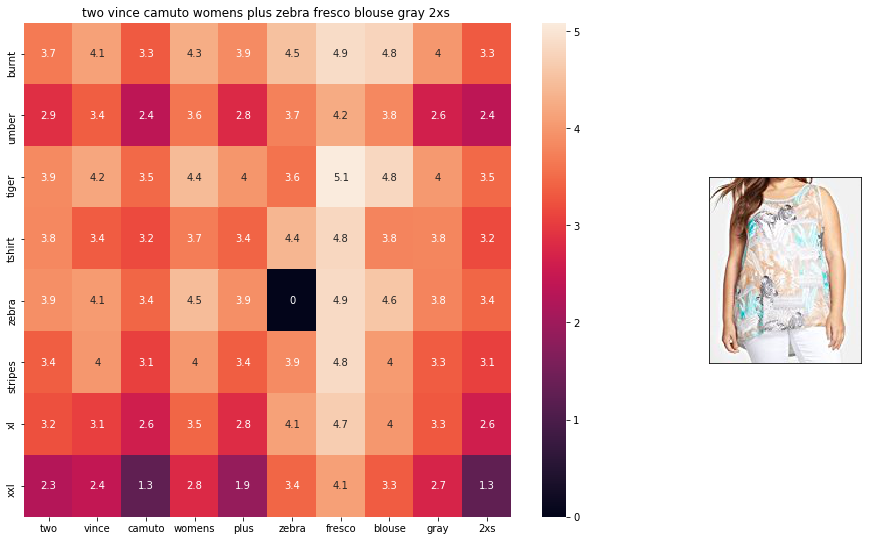

ASIN : B074MJRGW6
BRAND : Two by Vince Camuto
euclidean distance from given input image : 1.0895


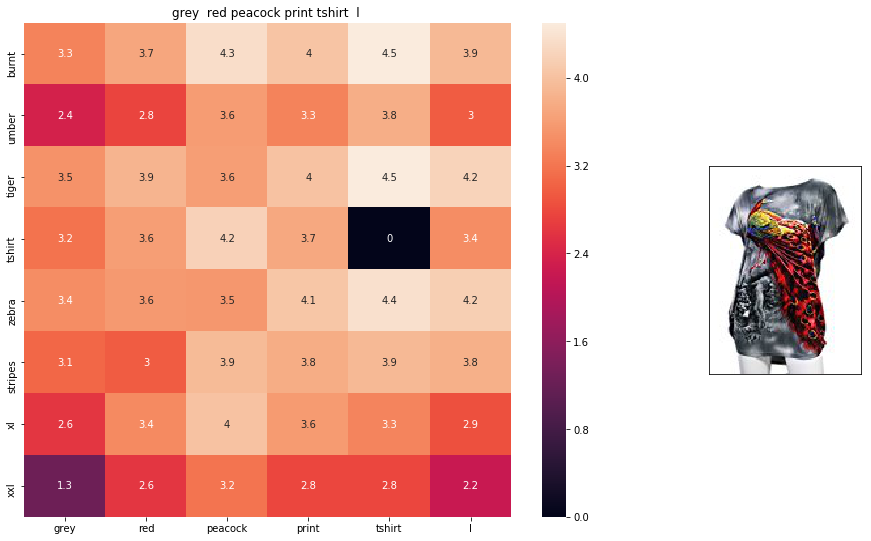

ASIN : B00JXQCFRS
BRAND : Si Row
euclidean distance from given input image : 1.09006


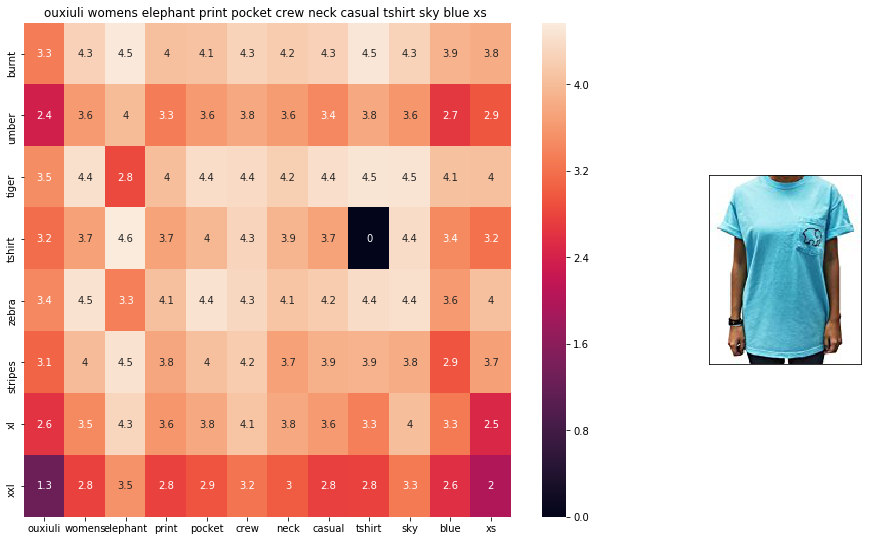

ASIN : B01I53HU6K
BRAND : ouxiuli
euclidean distance from given input image : 1.09201


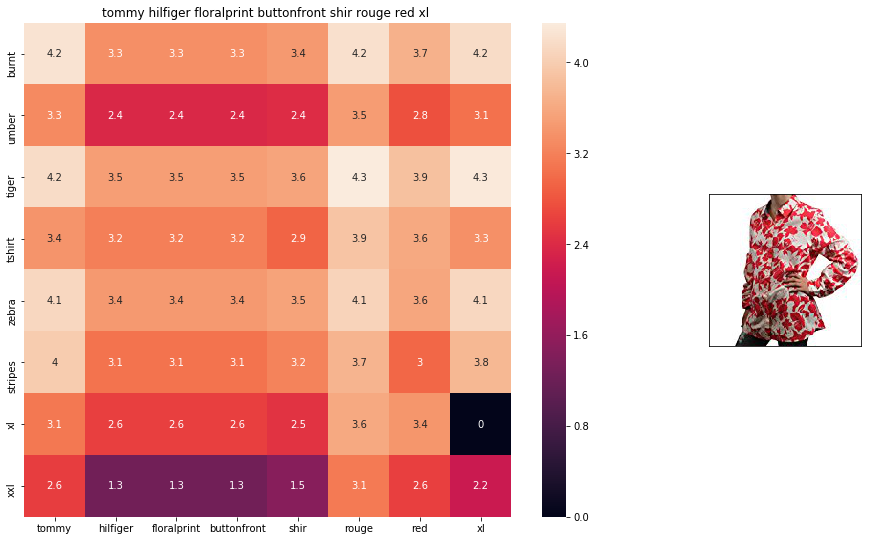

ASIN : B0711NGTQM
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.09234


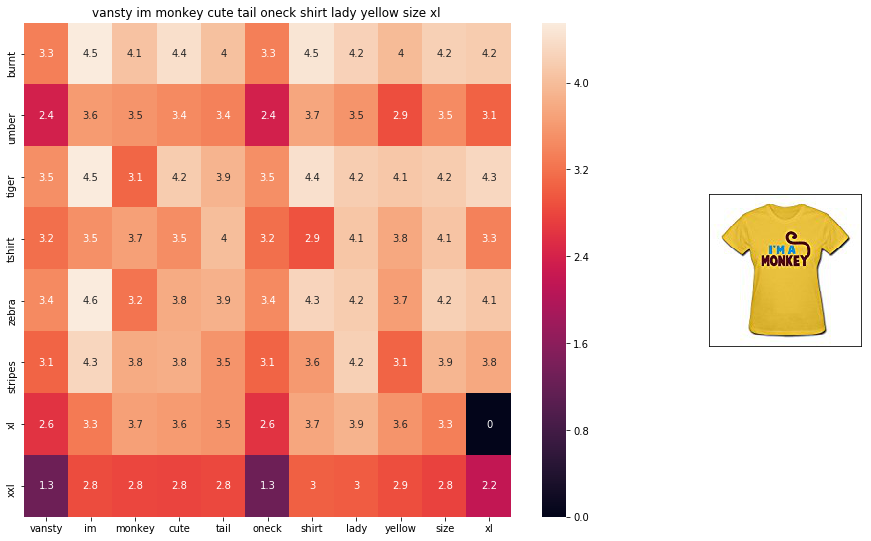

ASIN : B01EFSLO8Y
BRAND : Vansty
euclidean distance from given input image : 1.0934


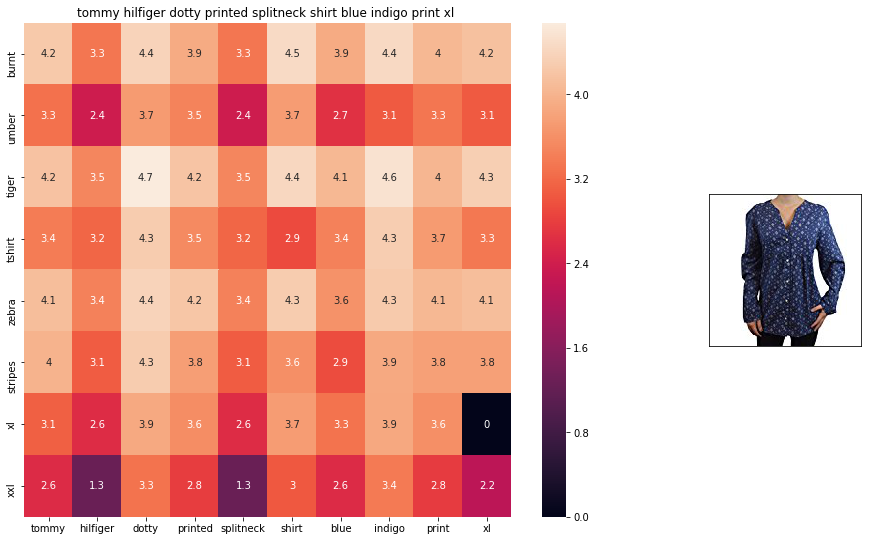

ASIN : B0716TVWQ4
BRAND : THILFIGER RTW
euclidean distance from given input image : 1.0942


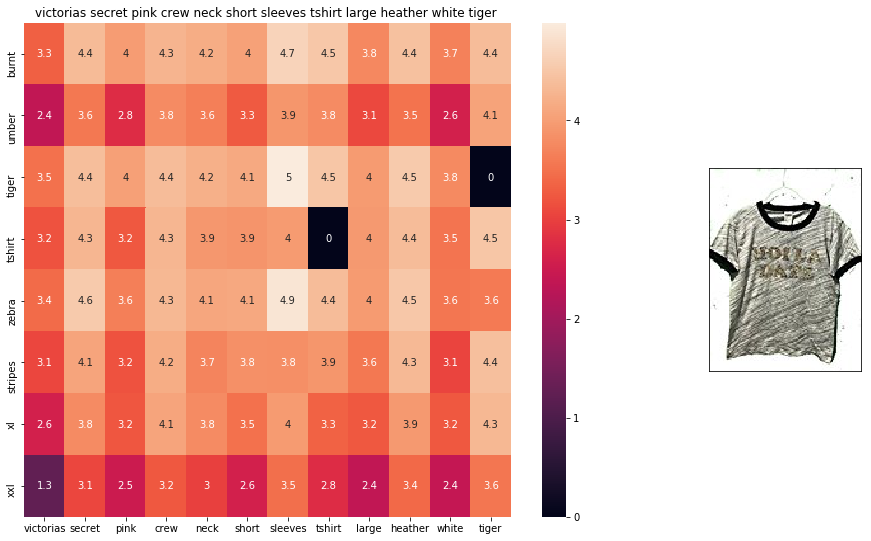

ASIN : B0716MVPGV
BRAND : V.Secret
euclidean distance from given input image : 1.09483


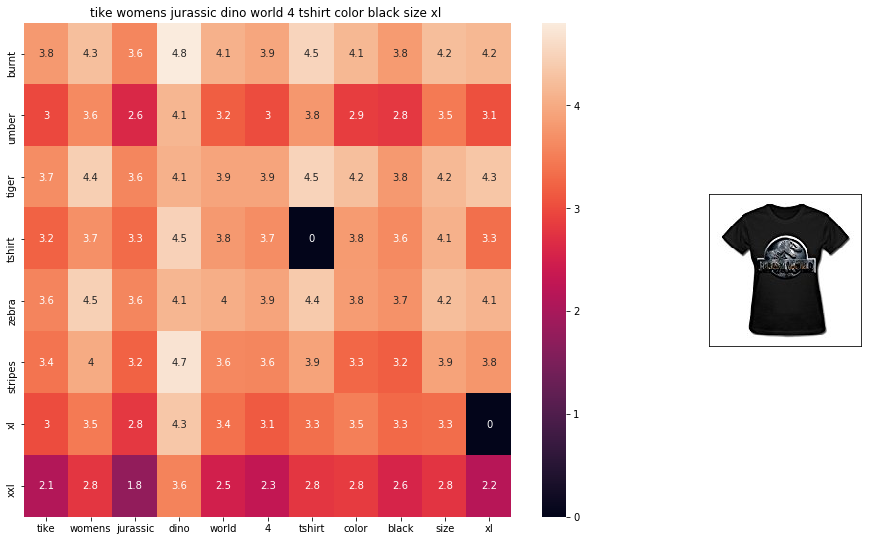

ASIN : B016OPN4OI
BRAND : TIKE Fashions
euclidean distance from given input image : 1.09513


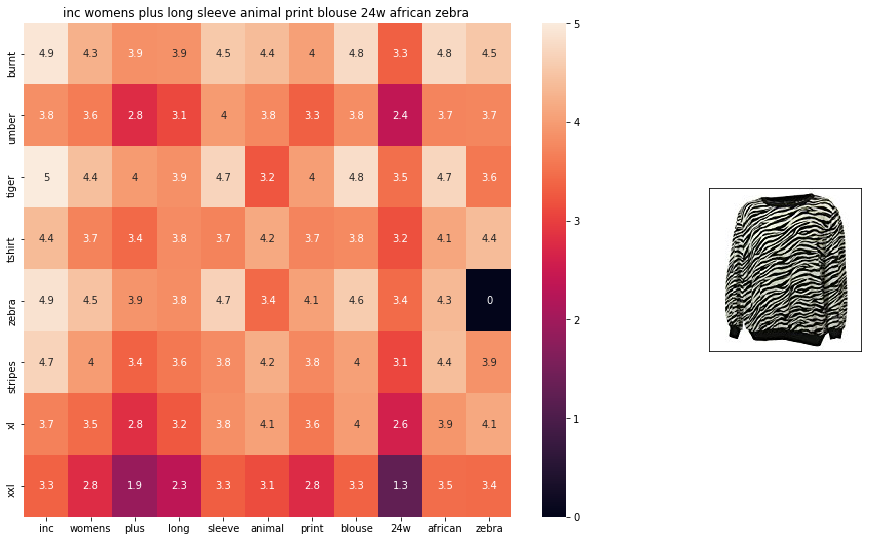

ASIN : B018WDJCUA
BRAND : INC - International Concepts Woman
euclidean distance from given input image : 1.09669


In [0]:
def avg_w2v_model(doc_id, num_results):
    
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)


### [9.4]  IDF weighted Word2Vec for product similarity

In [15]:
doc_id = 0
w2v_title_weight = []
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
w2v_title_weight = np.array(w2v_title_weight)

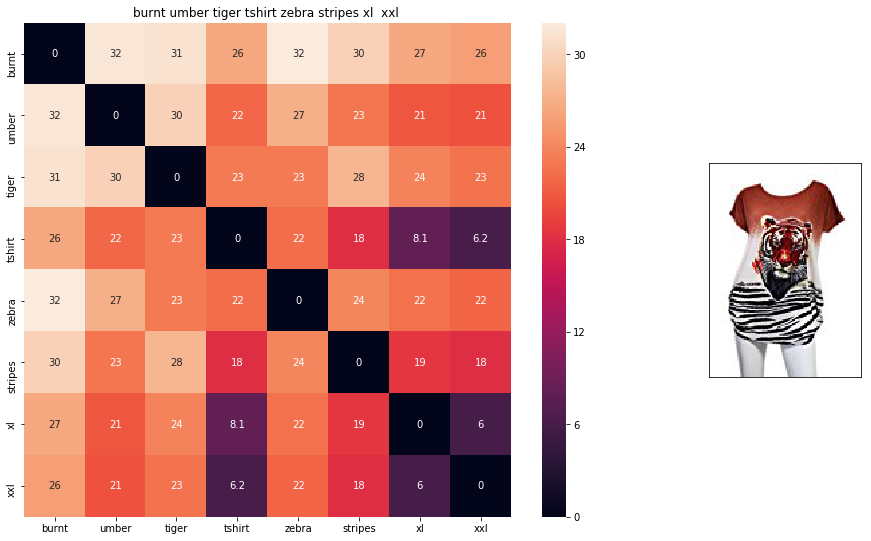

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.00390625


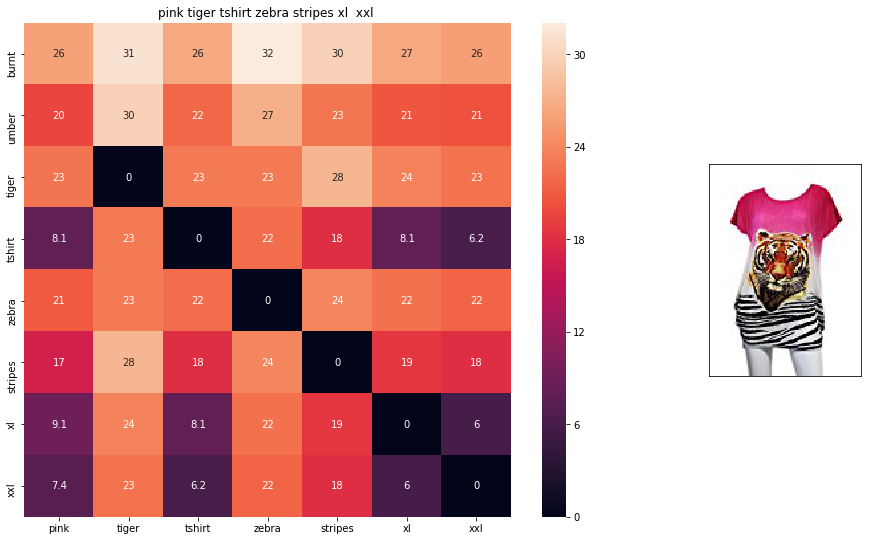

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.06389


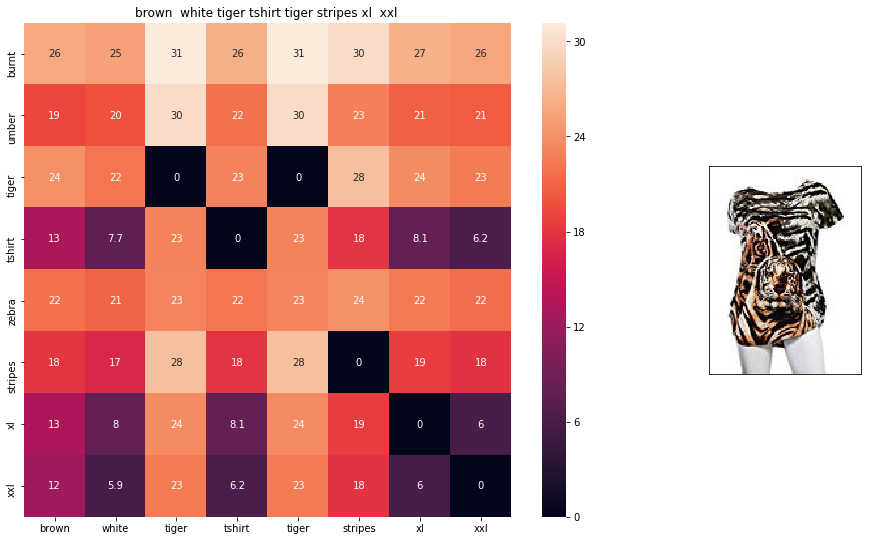

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 4.77094


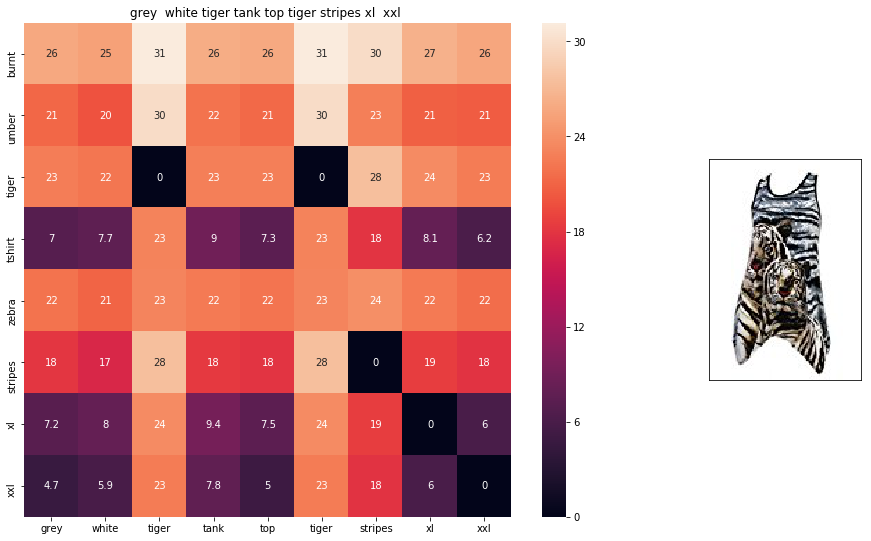

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 5.36016


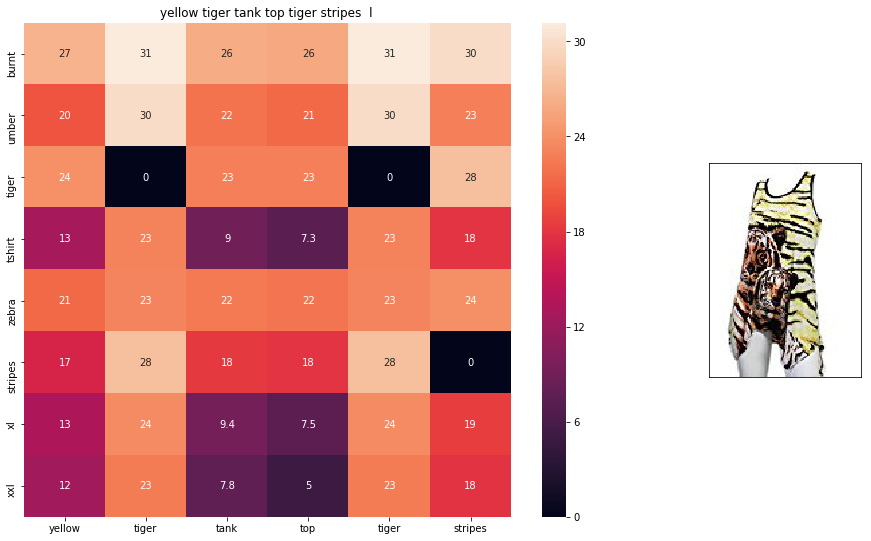

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 5.68952


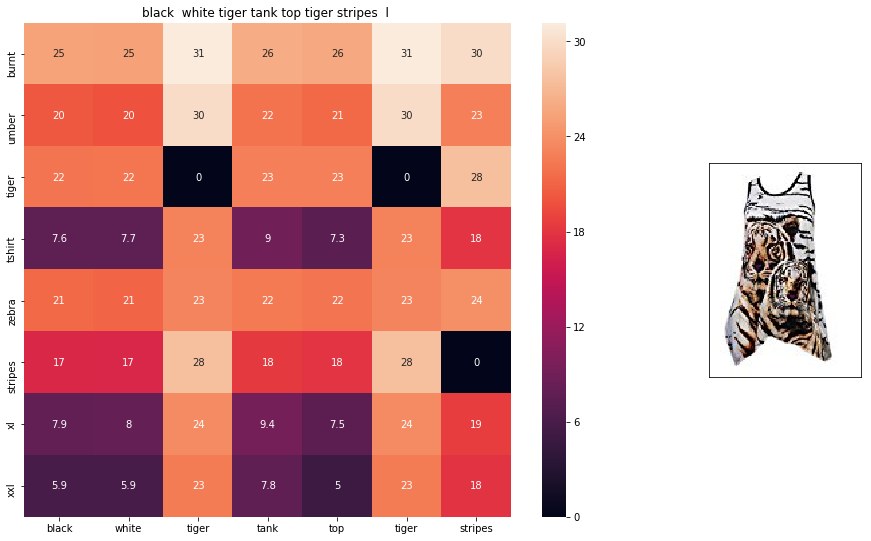

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 5.69302


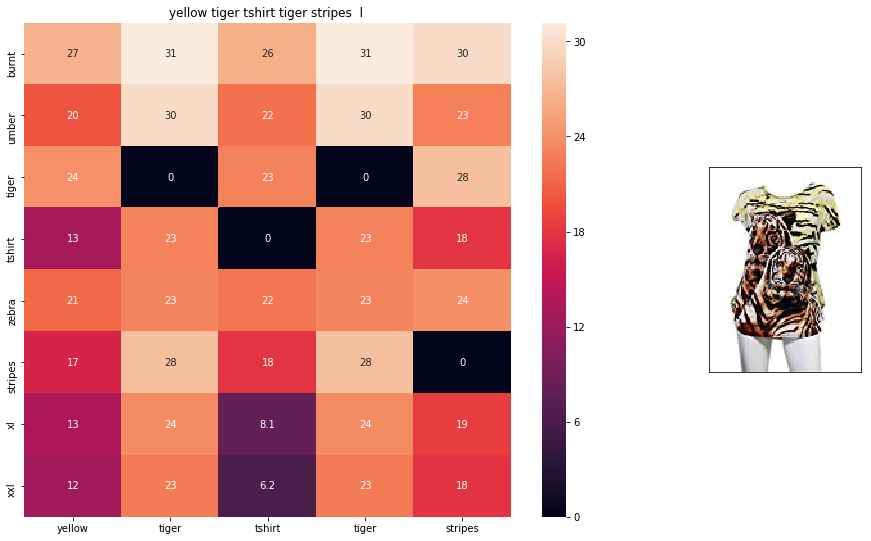

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 5.89344


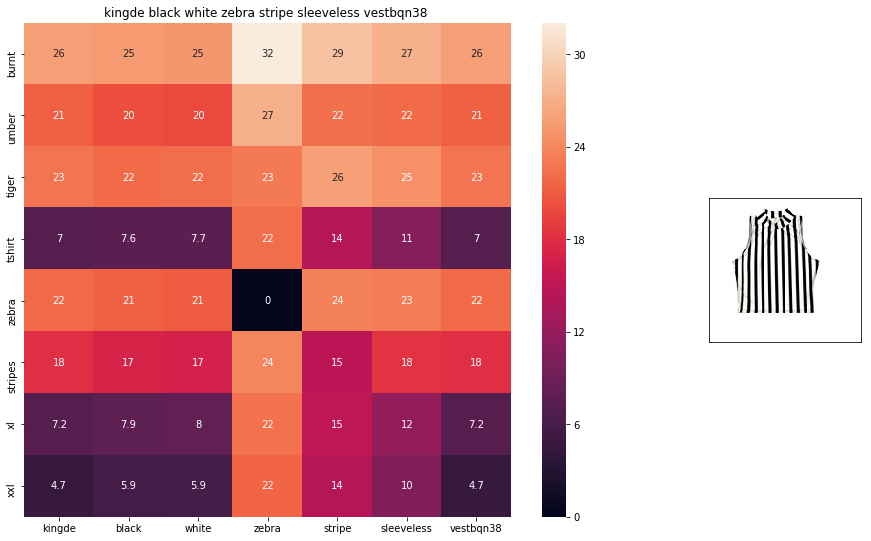

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 6.13299


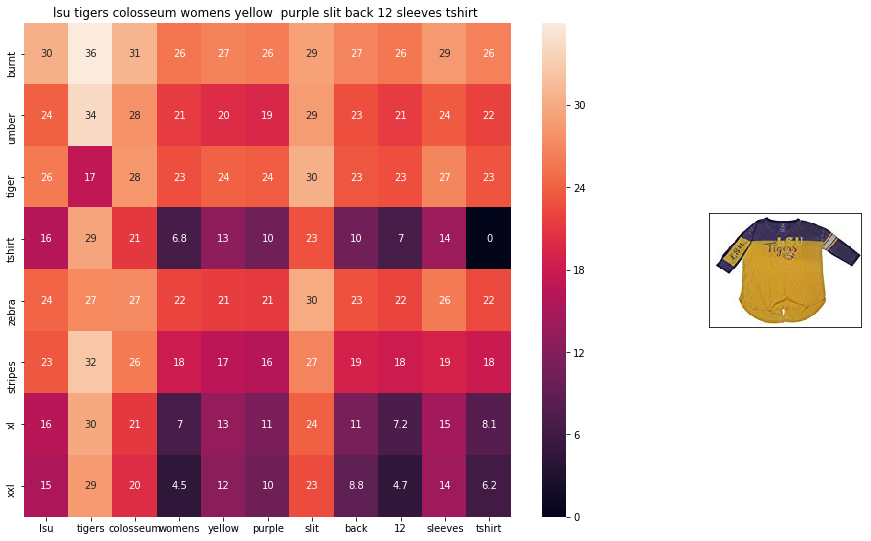

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 6.25671


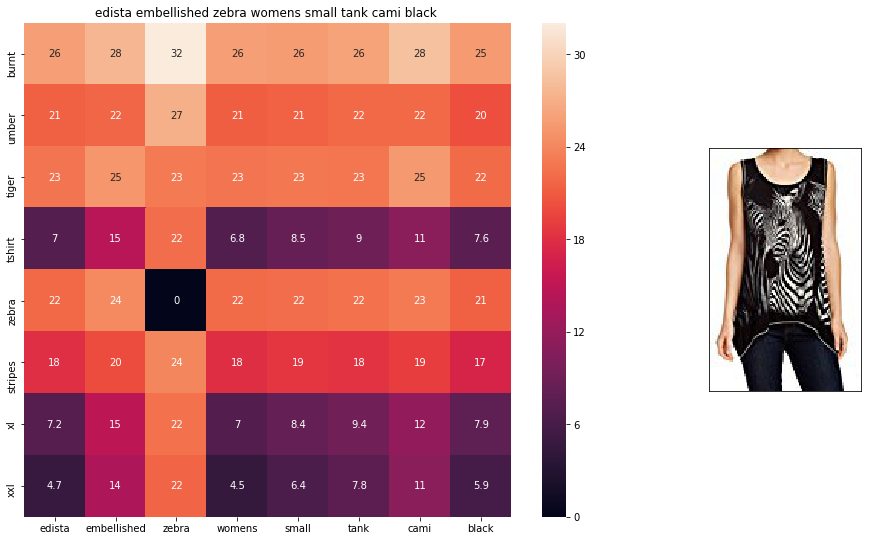

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 6.3922


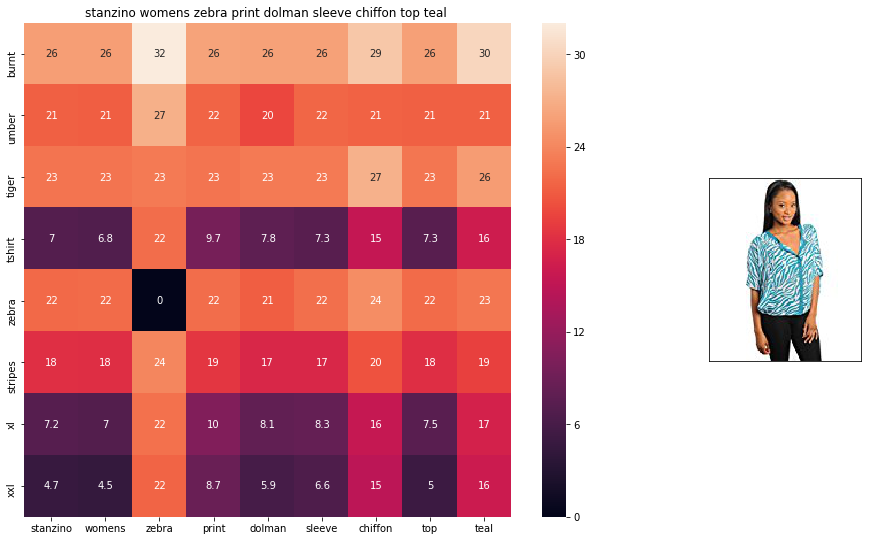

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 6.4149


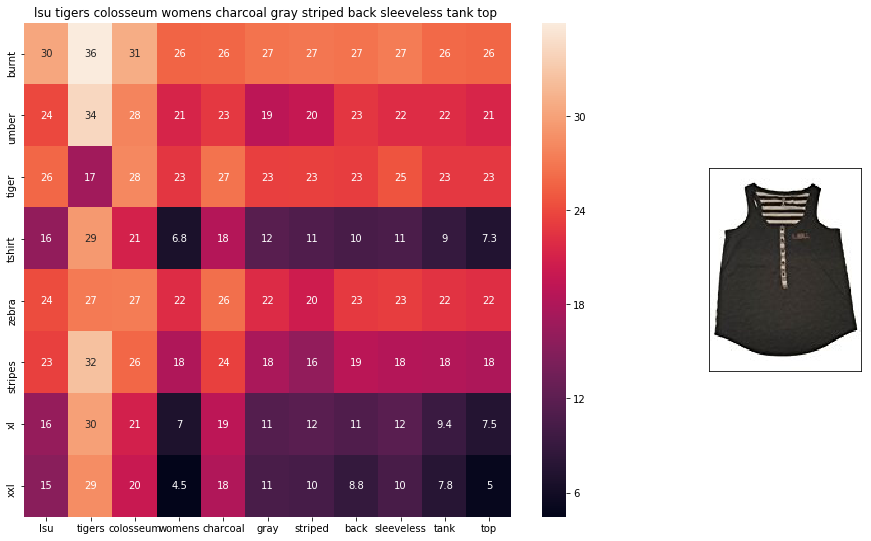

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 6.45096


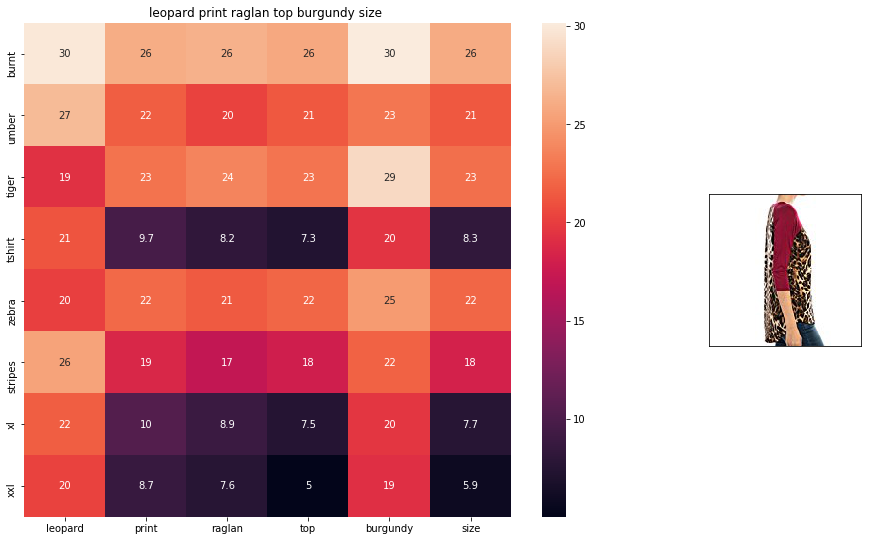

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 6.46341


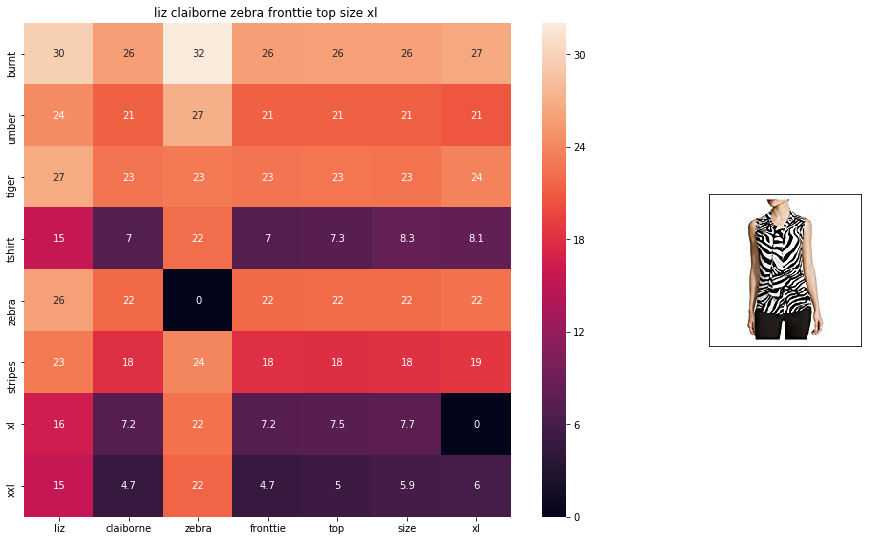

ASIN : B06XBY5QXL
Brand : Liz Claiborne
euclidean distance from input : 6.53922


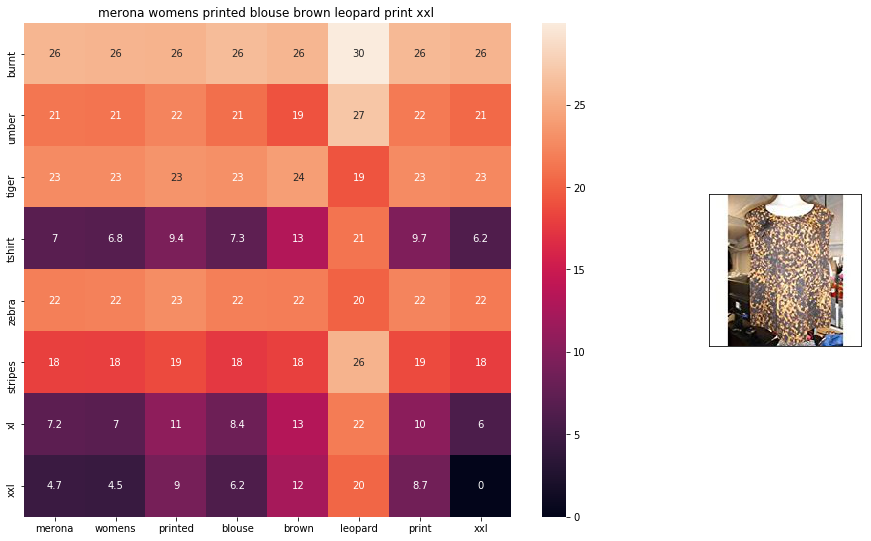

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 6.5755


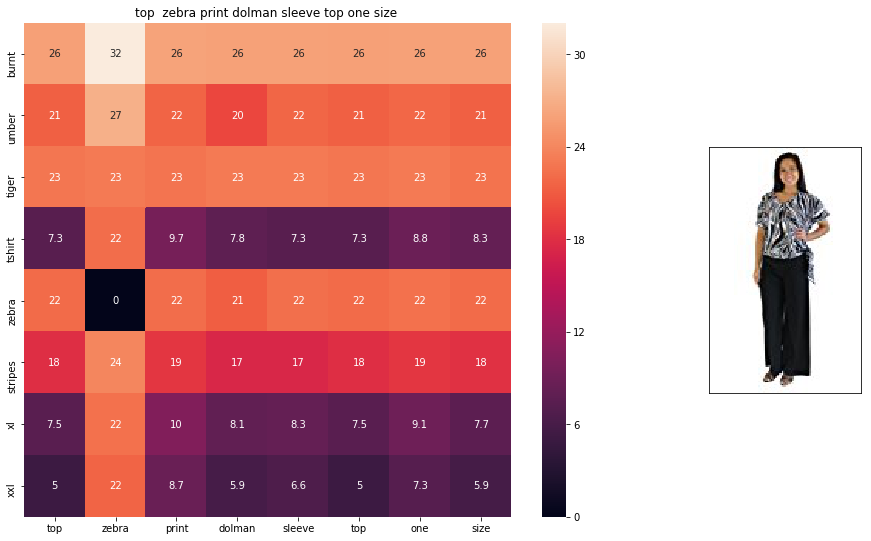

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from input : 6.63821


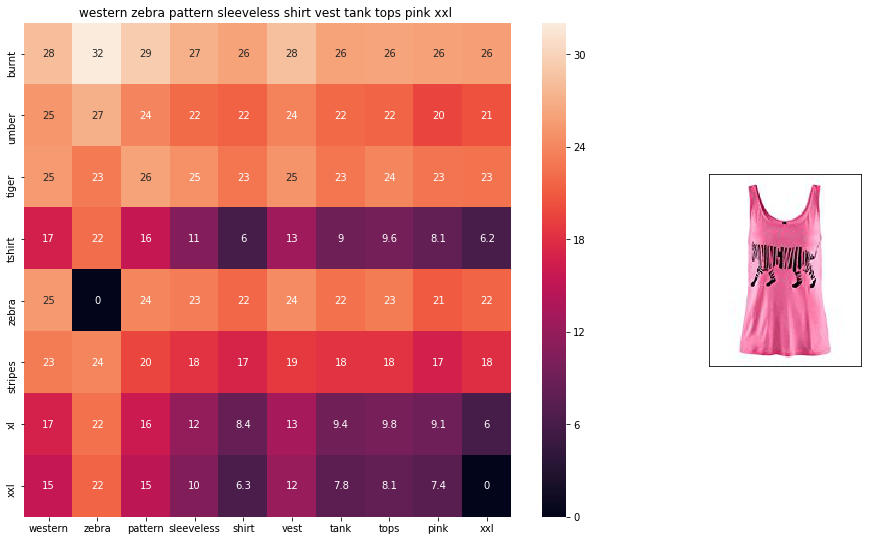

ASIN : B00Z6HEXWI
Brand : Black Temptation
euclidean distance from input : 6.66074


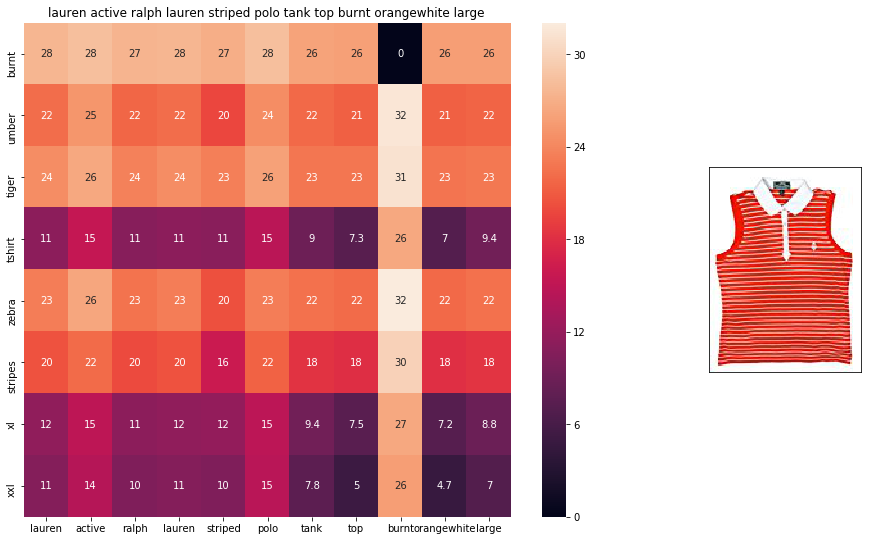

ASIN : B00ILGH5OY
Brand : Ralph Lauren Active
euclidean distance from input : 6.68391


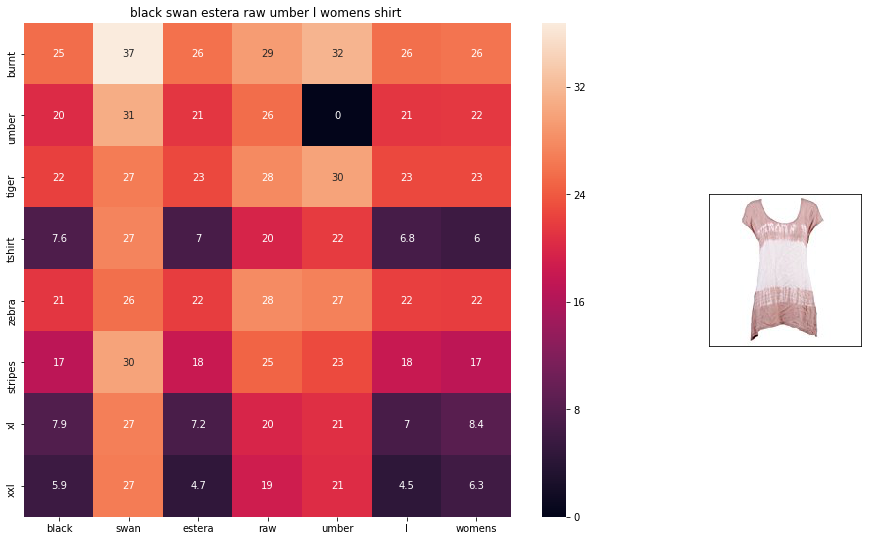

ASIN : B06Y1VN8WQ
Brand : Black Swan
euclidean distance from input : 6.70576


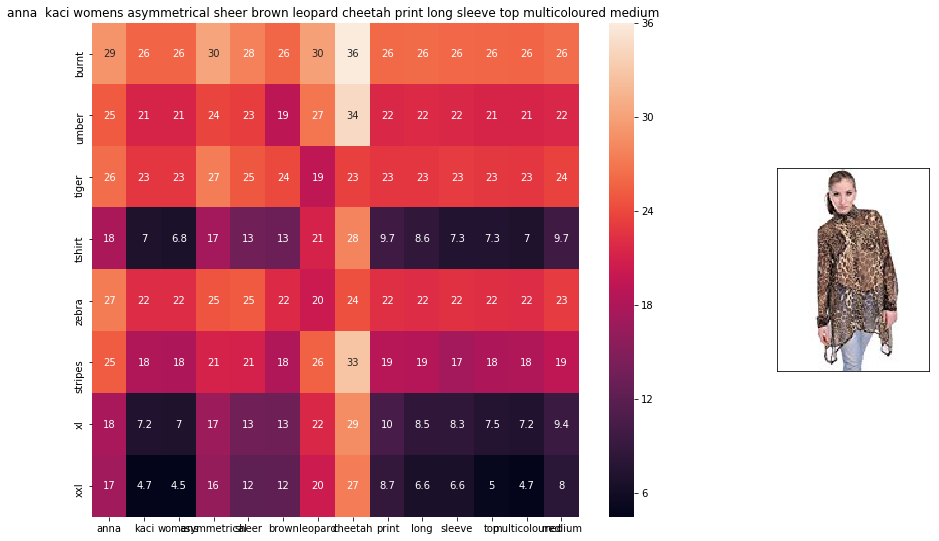

ASIN : B00KSNTY7Y
Brand : Anna-Kaci
euclidean distance from input : 6.70612


In [0]:
def weighted_w2v_model(doc_id, num_results):
    
   
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)


### [9.6] Weighted similarity using brand and color.

In [16]:

data['brand'].fillna(value="Not given", inplace=True )

brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [20]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    plotly.offline.iplot(table, filename='simple_table')
    
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    ax1 = plt.subplot(gs[:, :-5])
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    ax1.set_xticklabels(sentance2.split())
    ax1.set_yticklabels(sentance1.split())
    ax1.set_title(sentance2)

    ax2 = plt.subplot(gs[:, 10:16])
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    display_img(url, ax2, fig)
    
    plt.show()

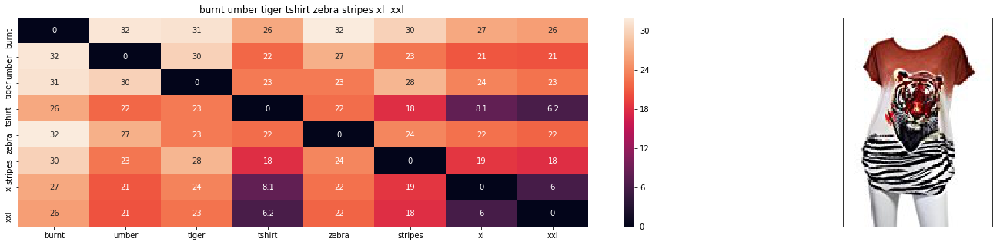

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.001953125


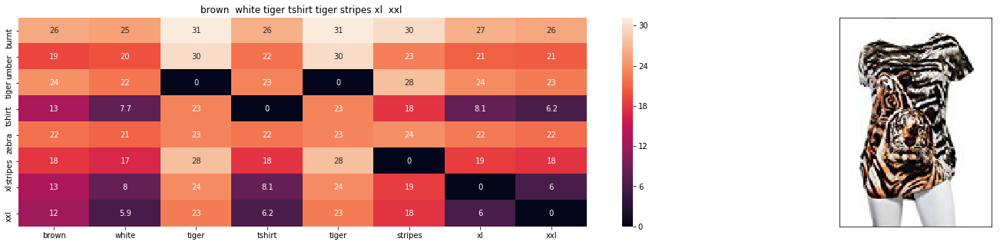

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.38547115326


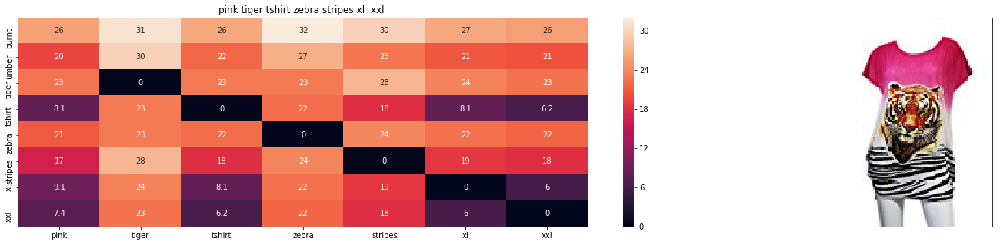

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 2.73905105609


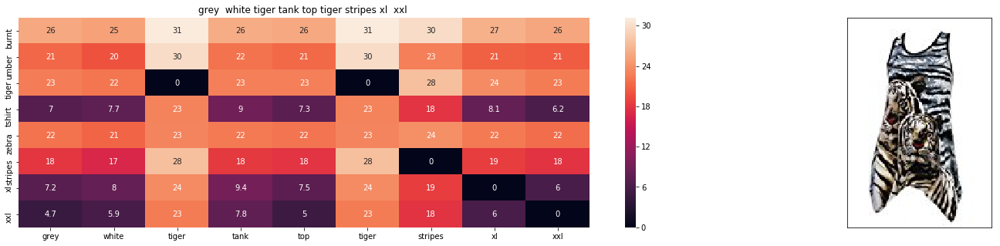

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 3.387187195


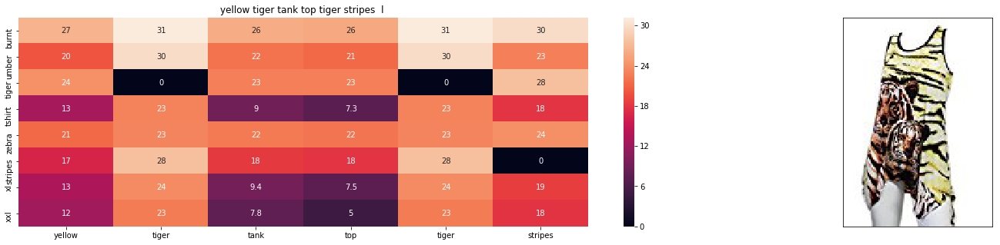

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 3.5518684389


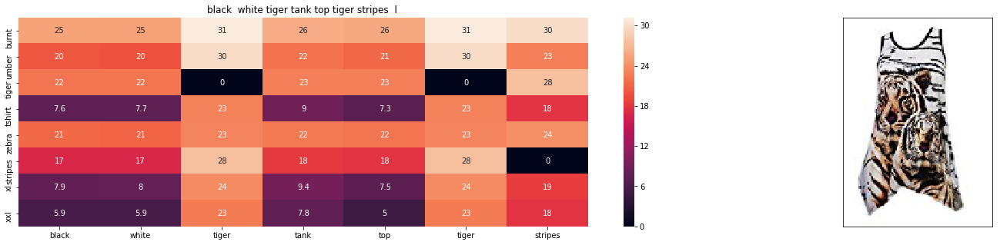

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 3.5536174776


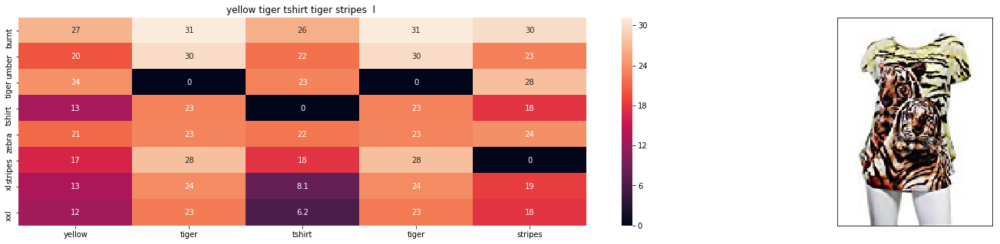

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 3.65382804889


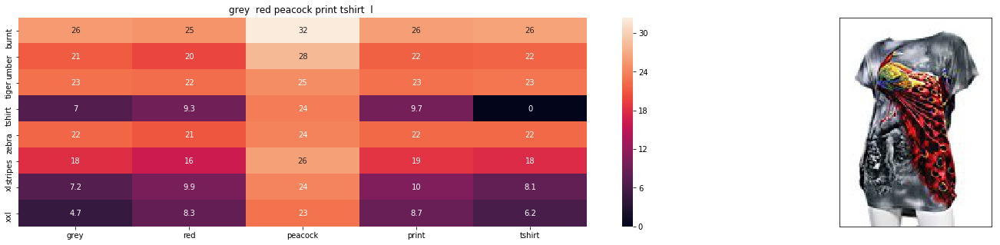

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.12881164569


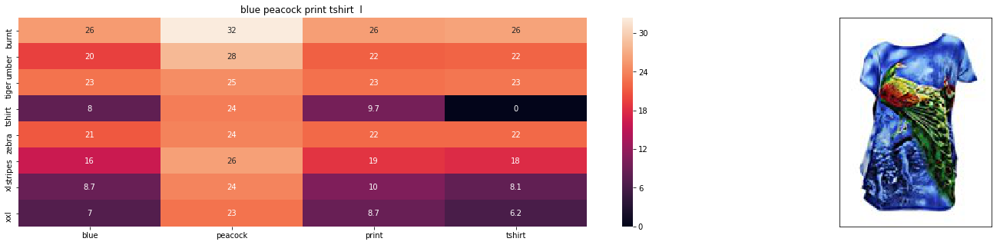

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 4.20390052813


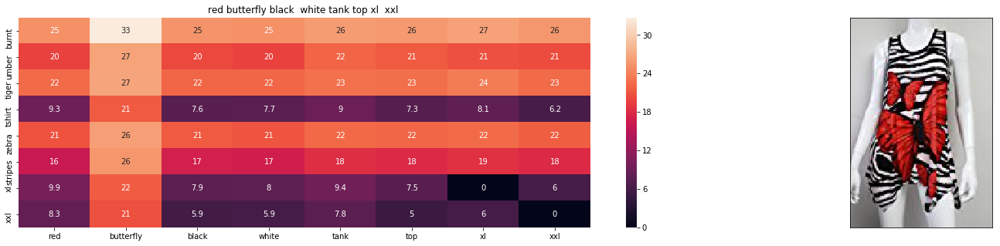

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.28658676166


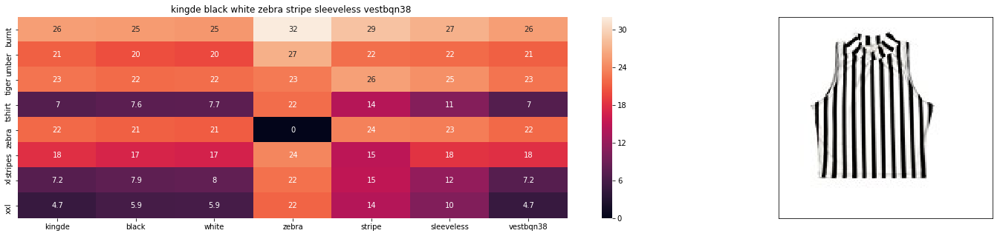

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 4.38937078798


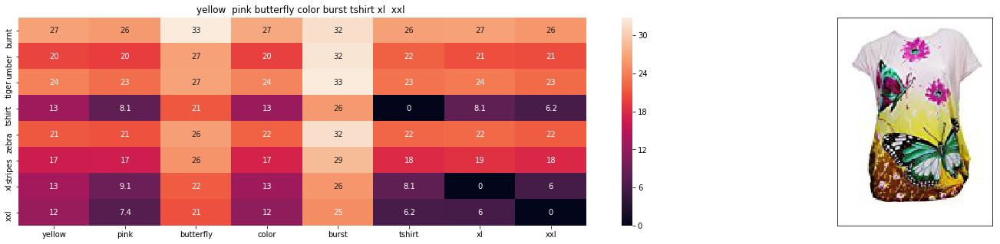

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.39790992755


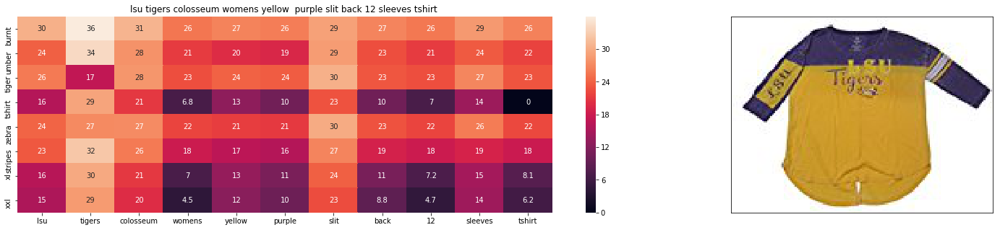

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 4.45122858369


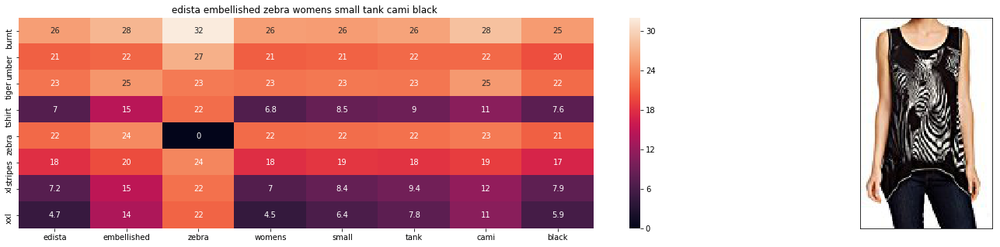

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 4.51897779787


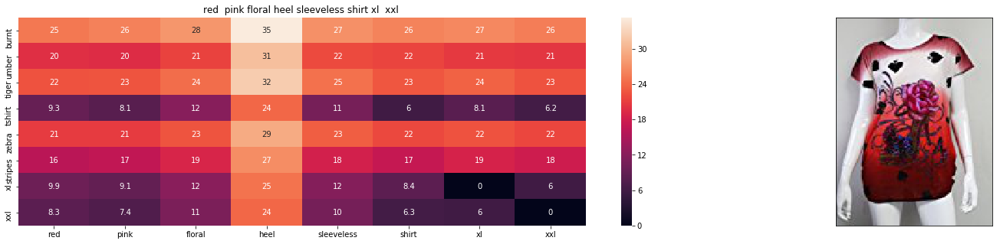

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.52937545794


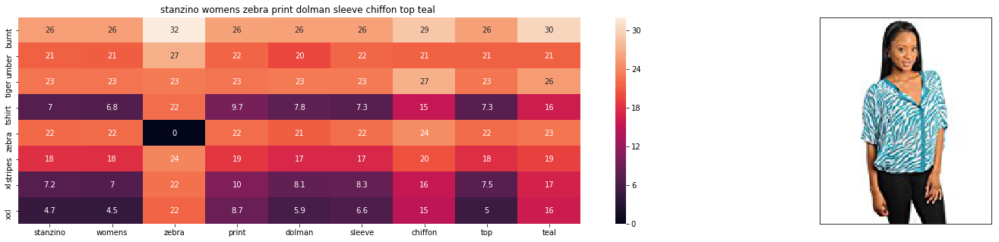

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 4.53032614076


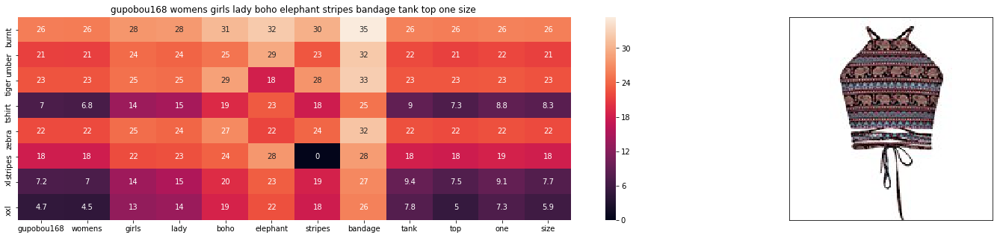

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 4.54681702403


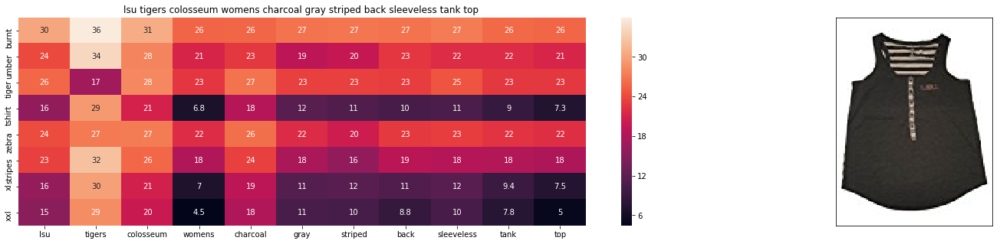

ASIN : B073R4ZM7Y
Brand : Colosseum
euclidean distance from input : 4.54835554445


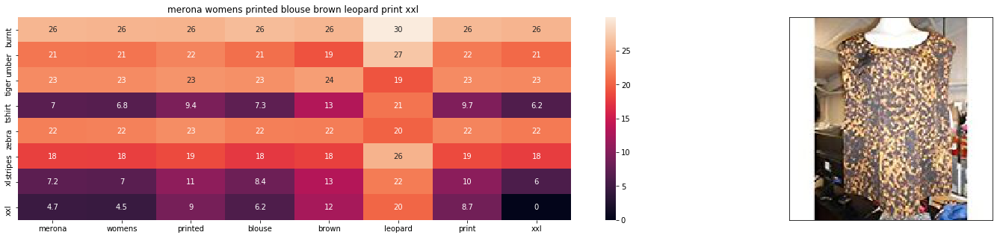

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 4.61062742555


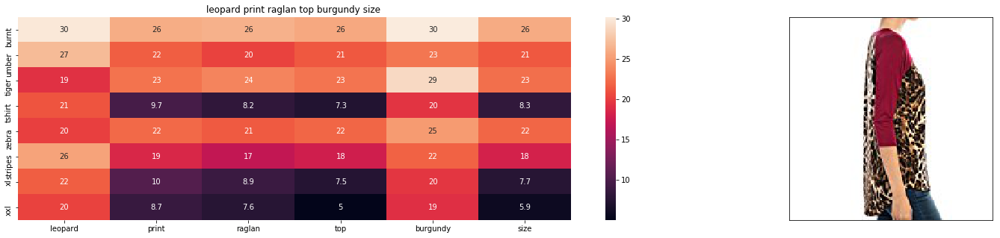

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 4.64591789282


In [0]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
   
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

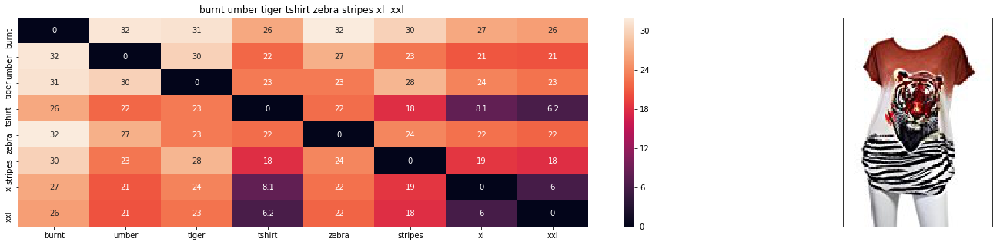

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.000355113636364


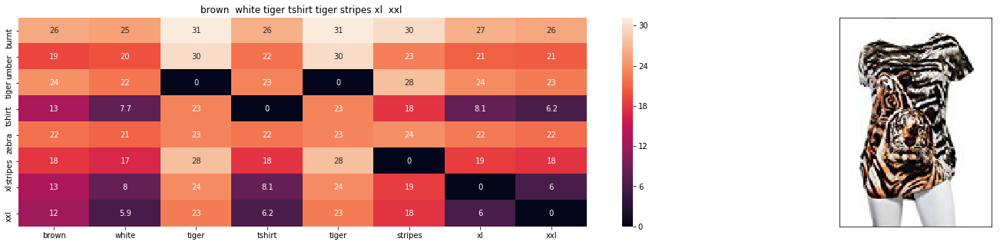

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.433722027865


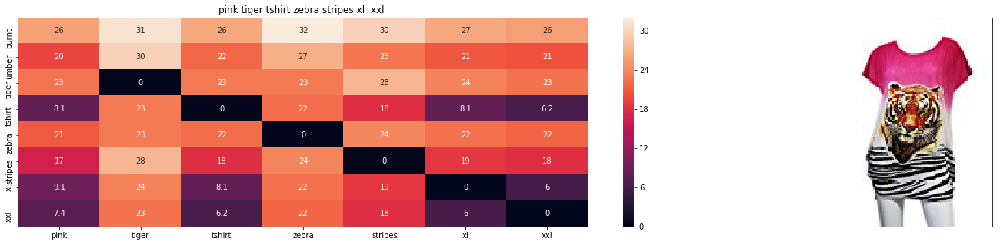

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 1.65509310669


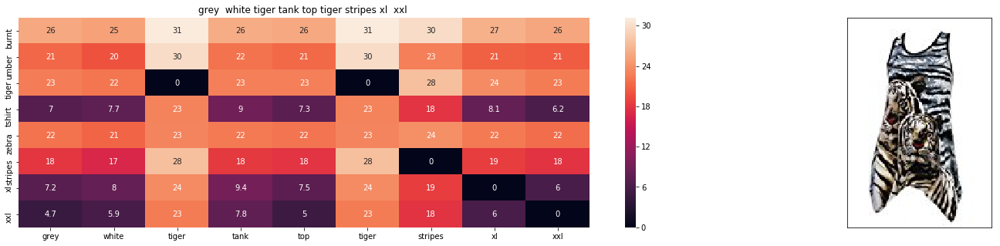

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 1.77293604103


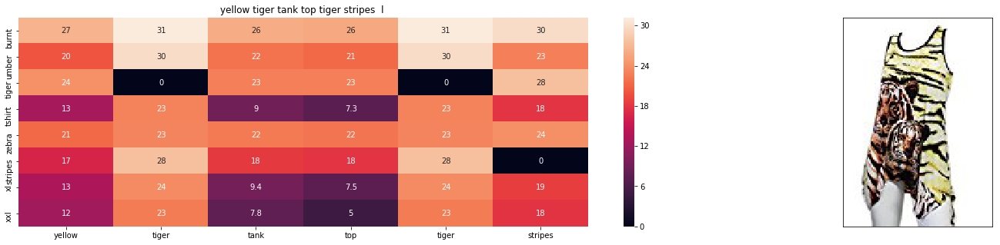

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 1.80287808538


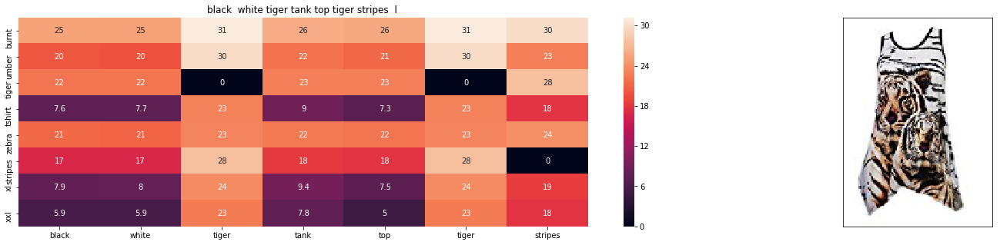

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 1.80319609241


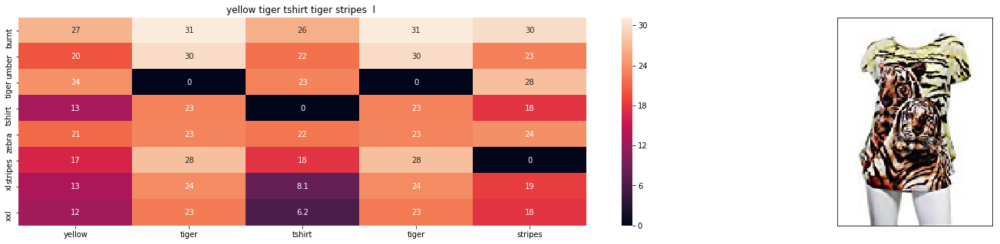

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 1.82141619628


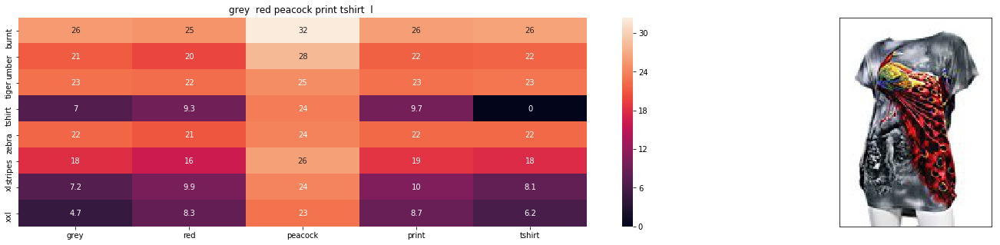

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 1.90777685025


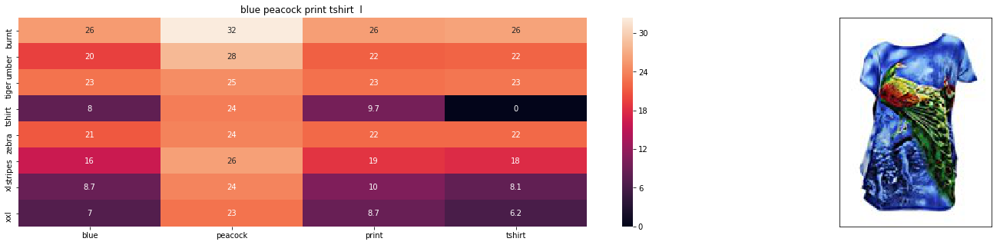

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 1.92142937433


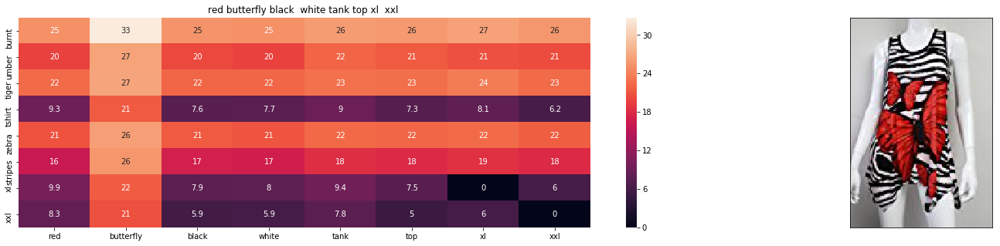

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 1.93646323497


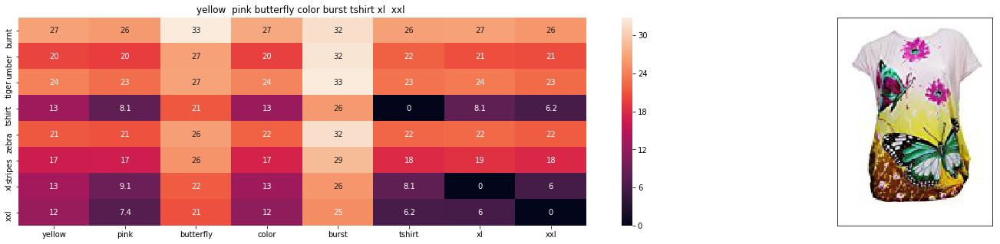

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 1.95670381059


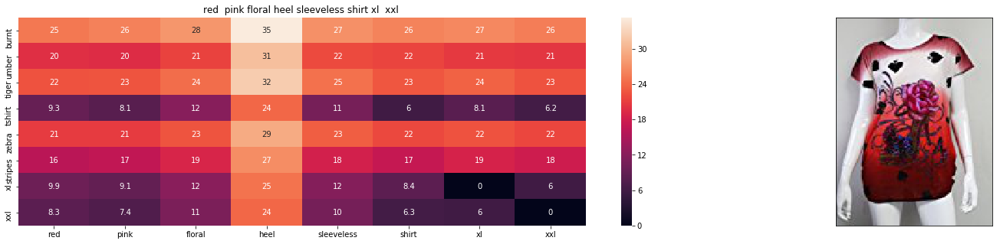

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 1.9806066343


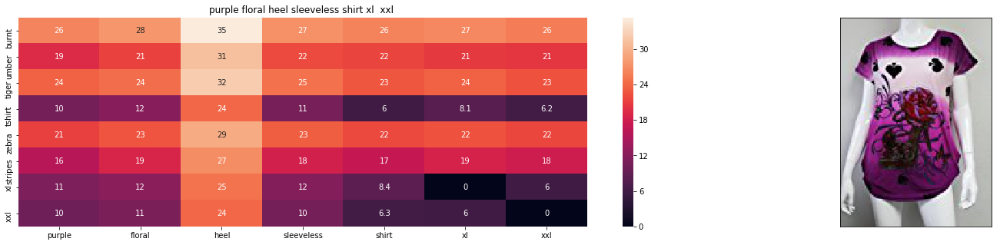

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 2.01218559992


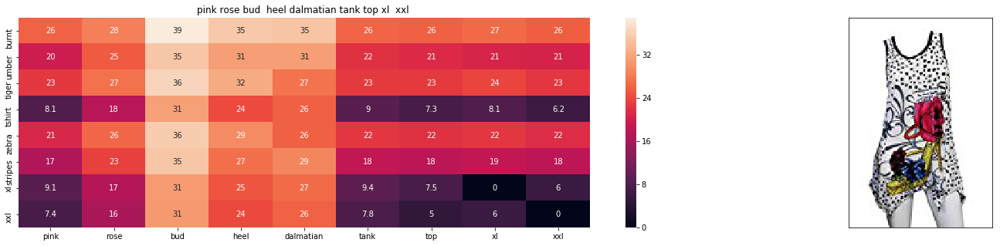

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 2.01335178755


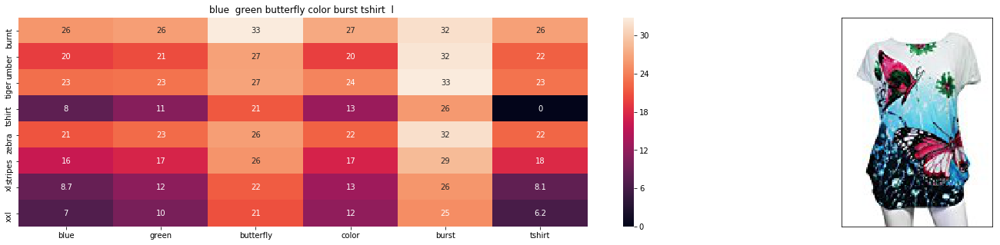

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 2.01388334827


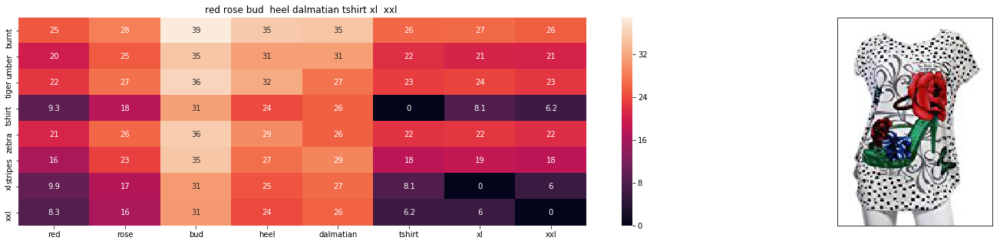

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 2.0367257555


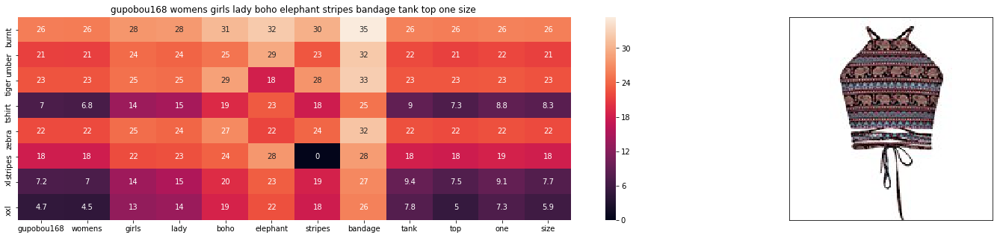

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 2.65620416778


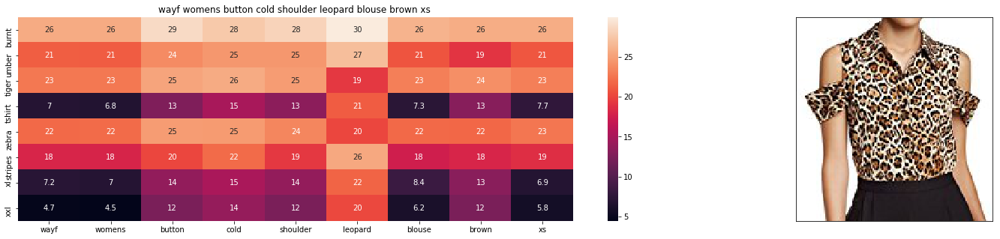

ASIN : B01LZ7BQ4H
Brand : WAYF
euclidean distance from input : 2.6849067823


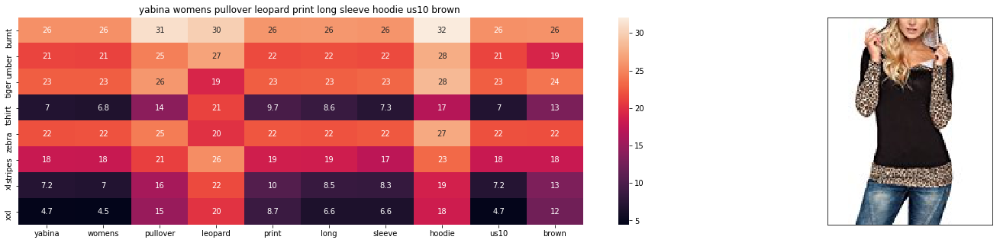

ASIN : B01KJUM6JI
Brand : YABINA
euclidean distance from input : 2.68583819266


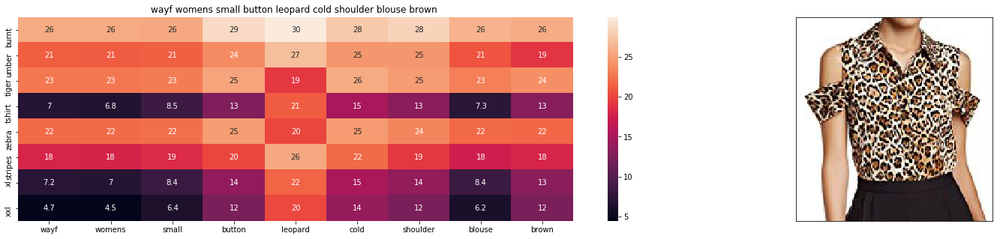

ASIN : B01M06V4X1
Brand : WAYF
euclidean distance from input : 2.69476194865


In [0]:
# brand and color weight =50
# title vector weight = 5

idf_w2v_brand(12566, 5, 50, 20)

# [10.2] Keras and Tensorflow to extract features

In [0]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

Using TensorFlow backend.


In [0]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html





# each image is converted into 25088 length dense-vector



# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    

save_bottlebeck_features()



# [10.3] Visual features based product similarity.

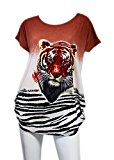

Product Title:  burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 0.0
Amazon Url: www.amzon.com/dp/B00JXQB5FQ


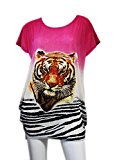

Product Title:  pink tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 30.0501
Amazon Url: www.amzon.com/dp/B00JXQASS6


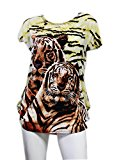

Product Title:  yellow tiger tshirt tiger stripes  l 
Euclidean Distance from input image: 41.2611
Amazon Url: www.amzon.com/dp/B00JXQCUIC


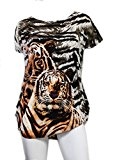

Product Title:  brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean Distance from input image: 44.0002
Amazon Url: www.amzon.com/dp/B00JXQCWTO


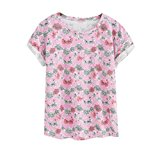

Product Title:  kawaii pastel tops tees pink flower design 
Euclidean Distance from input image: 47.3825
Amazon Url: www.amzon.com/dp/B071FCWD97


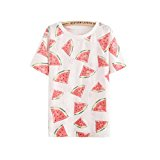

Product Title:  womens thin style tops tees pastel watermelon print 
Euclidean Distance from input image: 47.7184
Amazon Url: www.amzon.com/dp/B01JUNHBRM


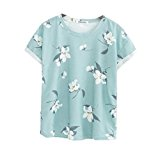

Product Title:  kawaii pastel tops tees baby blue flower design 
Euclidean Distance from input image: 47.9021
Amazon Url: www.amzon.com/dp/B071SBCY9W


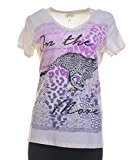

Product Title:  edv cheetah run purple multi xl 
Euclidean Distance from input image: 48.0465
Amazon Url: www.amzon.com/dp/B01CUPYBM0


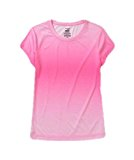

Product Title:  danskin womens vneck loose performance tee xsmall pink ombre 
Euclidean Distance from input image: 48.1019
Amazon Url: www.amzon.com/dp/B01F7PHXY8


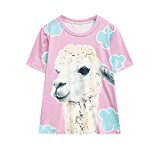

Product Title:  summer alpaca 3d pastel casual loose tops tee design 
Euclidean Distance from input image: 48.1189
Amazon Url: www.amzon.com/dp/B01I80A93G


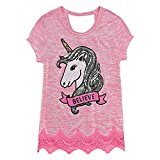

Product Title:  miss chievous juniors striped peplum tank top medium shadowpeach 
Euclidean Distance from input image: 48.1313
Amazon Url: www.amzon.com/dp/B0177DM70S


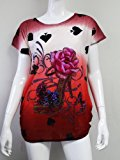

Product Title:  red  pink floral heel sleeveless shirt xl  xxl 
Euclidean Distance from input image: 48.1695
Amazon Url: www.amzon.com/dp/B00JV63QQE


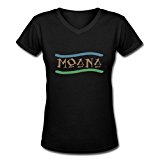

Product Title:  moana logo adults hot v neck shirt black xxl 
Euclidean Distance from input image: 48.2568
Amazon Url: www.amzon.com/dp/B01LX6H43D


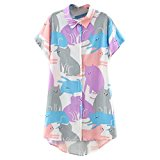

Product Title:  abaday multicolor cartoon cat print short sleeve longline shirt large 
Euclidean Distance from input image: 48.2657
Amazon Url: www.amzon.com/dp/B01CR57YY0


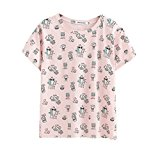

Product Title:  kawaii cotton pastel tops tees peach pink cactus design 
Euclidean Distance from input image: 48.3626
Amazon Url: www.amzon.com/dp/B071WYLBZS


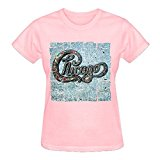

Product Title:  chicago chicago 18 shirt women pink 
Euclidean Distance from input image: 48.3836
Amazon Url: www.amzon.com/dp/B01GXAZTRY


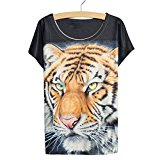

Product Title:  yichun womens tiger printed summer tshirts tops 
Euclidean Distance from input image: 48.4493
Amazon Url: www.amzon.com/dp/B010NN9RXO


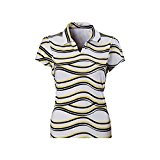

Product Title:  nancy lopez whimsy short sleeve  whiteblacklemon drop  xs 
Euclidean Distance from input image: 48.4788
Amazon Url: www.amzon.com/dp/B01MPX6IDX


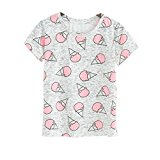

Product Title:  womens tops tees pastel peach ice cream cone print 
Euclidean Distance from input image: 48.558
Amazon Url: www.amzon.com/dp/B0734GRKZL


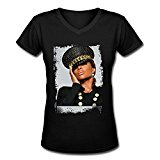

Product Title:  uswomens mary j blige without tshirts shirt 
Euclidean Distance from input image: 48.6144
Amazon Url: www.amzon.com/dp/B01M0XXFKK


In [0]:

bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)


data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo



def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 20)


## Title + Brand + Color + Image :

In [17]:
bottleneck_features_train = np.load('16k_data_cnn_features.npy')

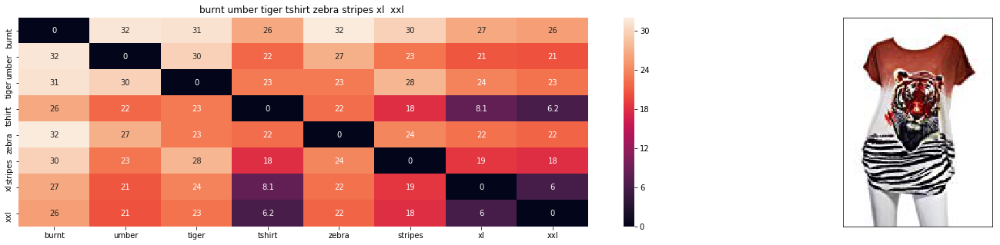

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0013020833333333333


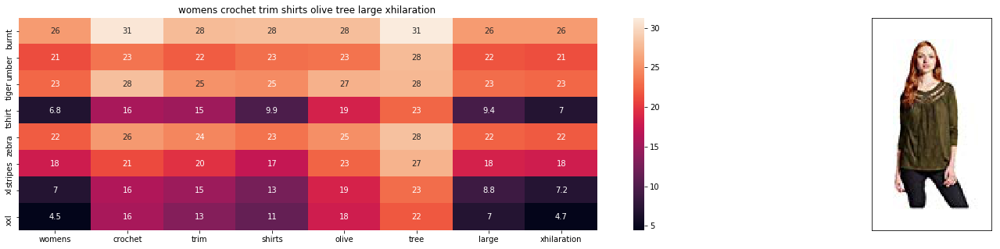

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 15.982596334062531


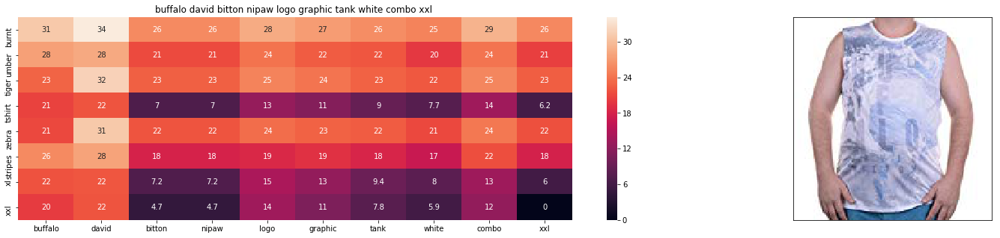

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 16.60389938378584


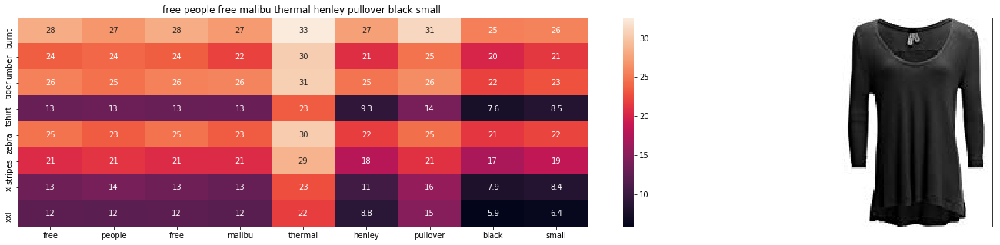

ASIN : B074MXY984
Brand : We The Free
euclidean distance from input : 16.9315793355306


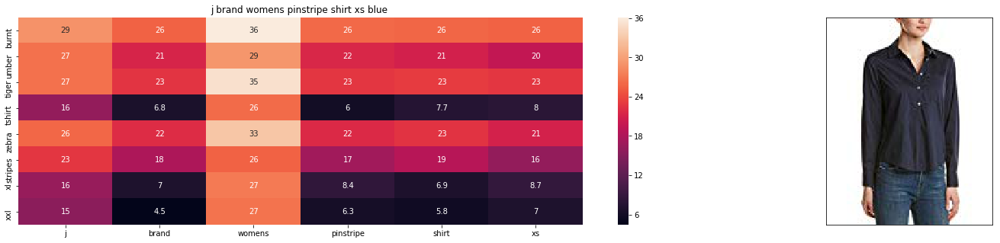

ASIN : B06XYP1X1F
Brand : J Brand Jeans
euclidean distance from input : 16.955509586267063


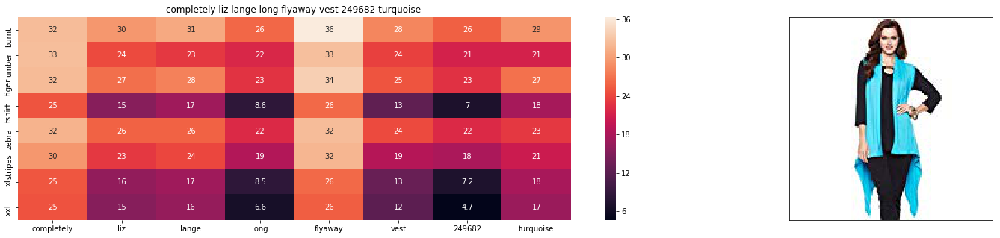

ASIN : B074LTBWSW
Brand : Liz Lange
euclidean distance from input : 16.957030995927767


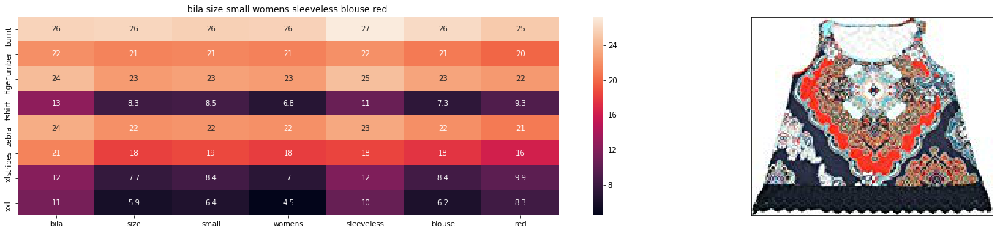

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 17.094785603444056


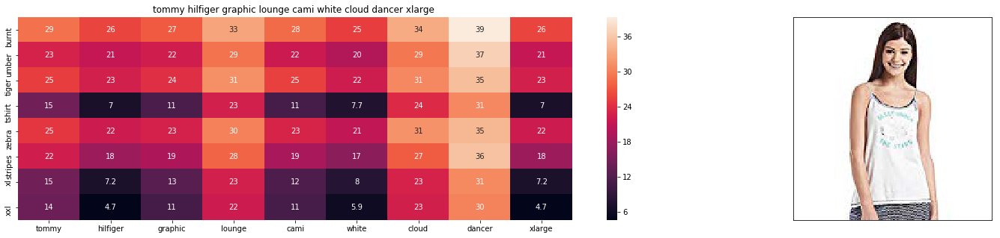

ASIN : B01BMSFYW2
Brand : igertommy hilf
euclidean distance from input : 17.28112604134519


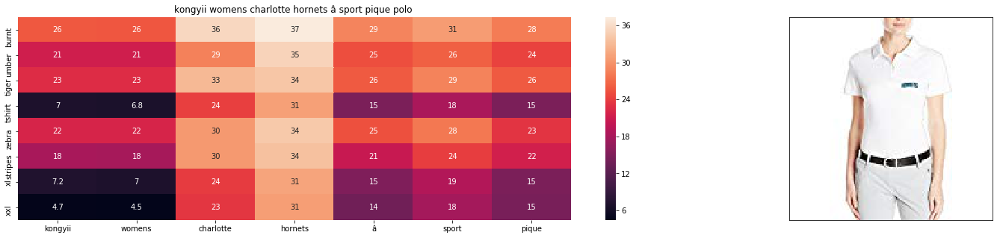

ASIN : B01FJVZST2
Brand : KONGYII
euclidean distance from input : 17.551688170989628


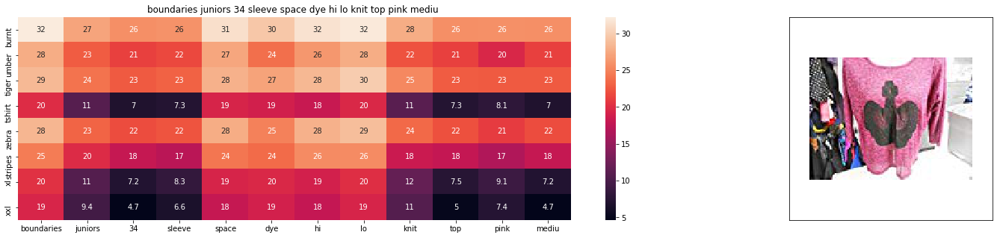

ASIN : B01EXXFS4M
Brand : No Boundaries
euclidean distance from input : 17.564531453691437


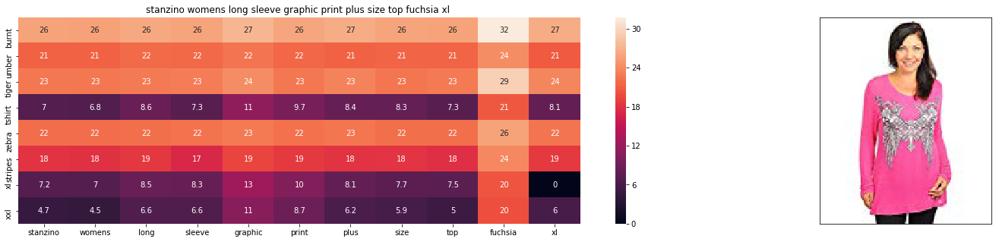

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 17.585476724863327


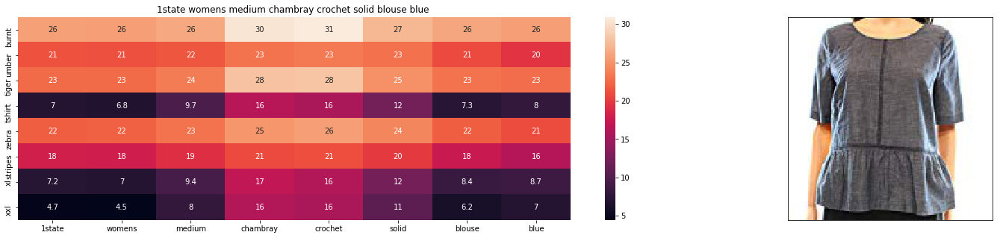

ASIN : B074MK6LV2
Brand : 1.State
euclidean distance from input : 17.59606810466476


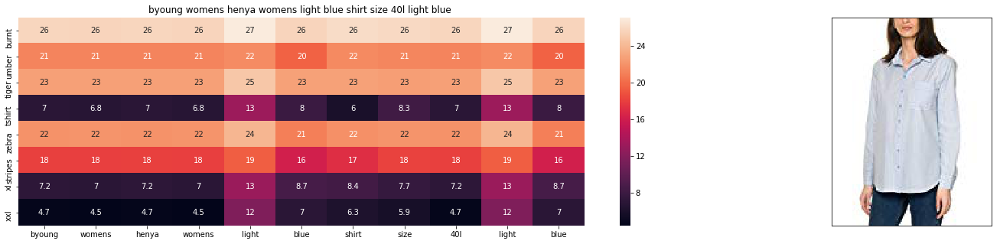

ASIN : B06Y41MRCH
Brand : Byoung
euclidean distance from input : 17.624772135657583


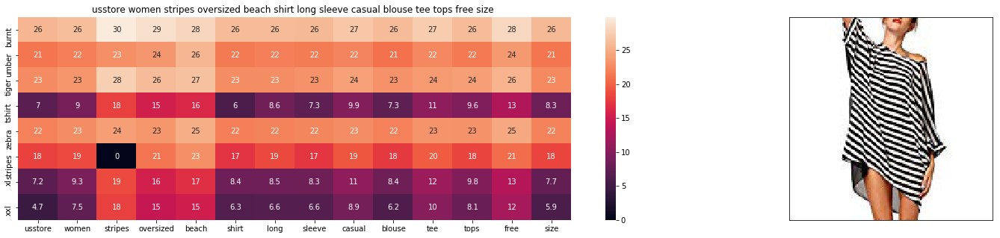

ASIN : B01DNNI1RO
Brand : Usstore
euclidean distance from input : 17.65560150170576


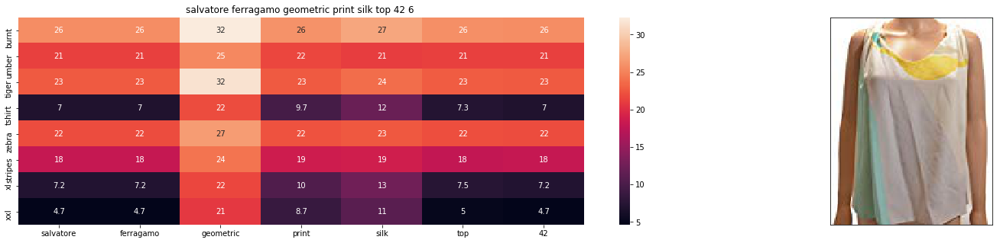

ASIN : B0756JTS1F
Brand : Salvatore Ferragamo
euclidean distance from input : 17.681495666503906


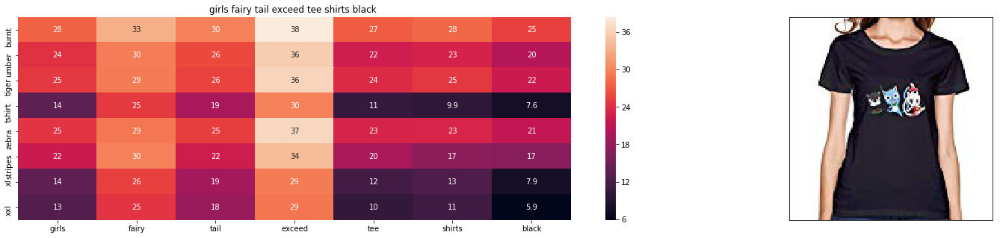

ASIN : B01L9F153U
Brand : ATYPEMX
euclidean distance from input : 17.69363432780929


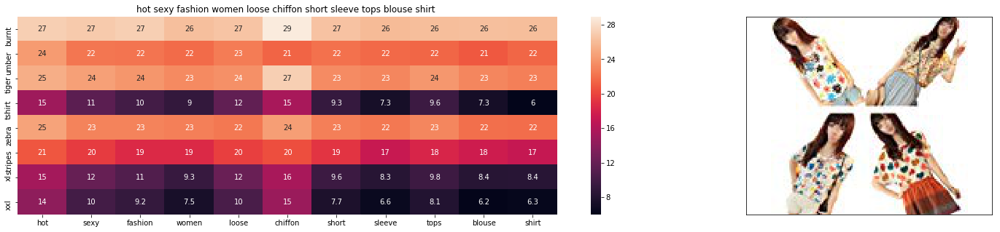

ASIN : B00JMAASRO
Brand : Wotefusi
euclidean distance from input : 17.70576048747726


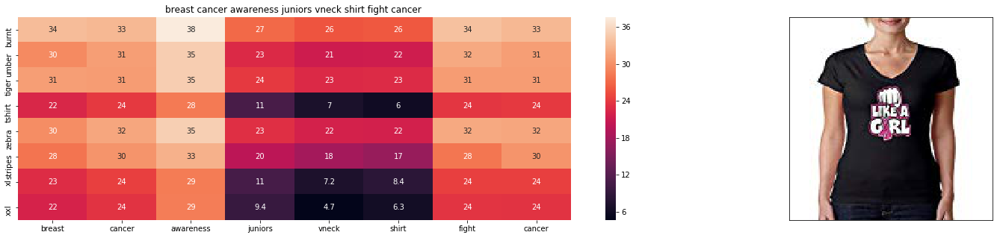

ASIN : B016CU40IY
Brand : Juiceclouds
euclidean distance from input : 17.709572641611373


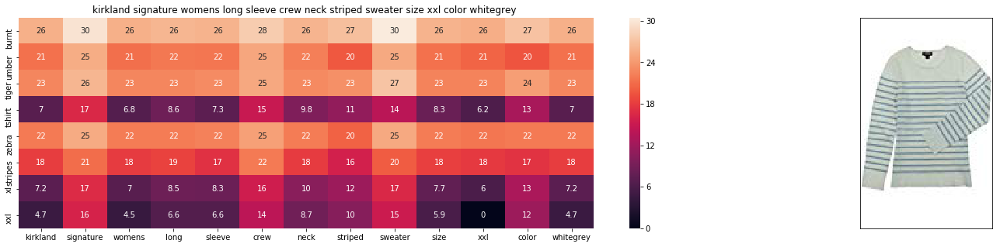

ASIN : B06XTPC3FP
Brand : Kirkland Signature
euclidean distance from input : 17.753979238115267


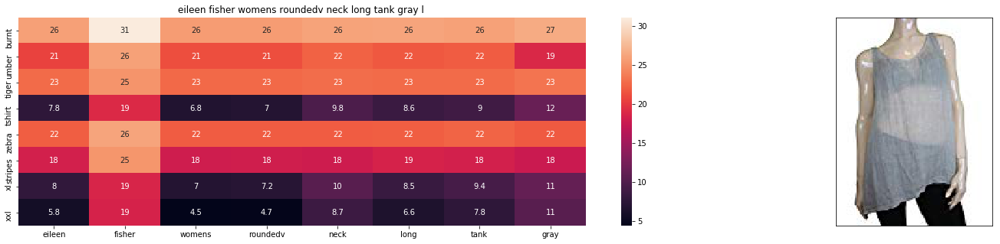

ASIN : B01N2JSRDM
Brand : Eileen Fisher
euclidean distance from input : 17.801957957190787


In [25]:
def idf_w2v_brand(doc_id, w1, w2, w3,num_results):
   
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    cnn_features_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * cnn_features_dist)/float(w1 + w2 + w3)

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5,5, 20)


###  Giving more weight to extra features (Brand and Colour):

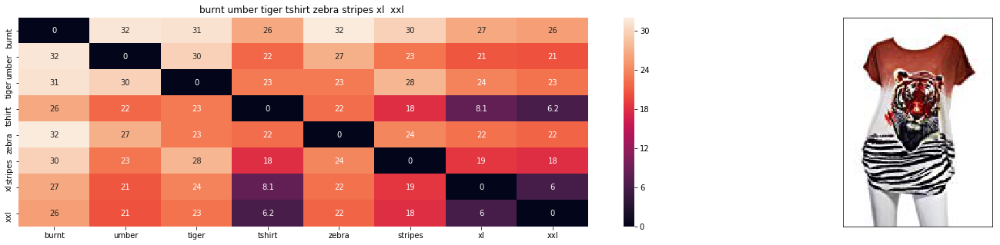

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0001775568181818182


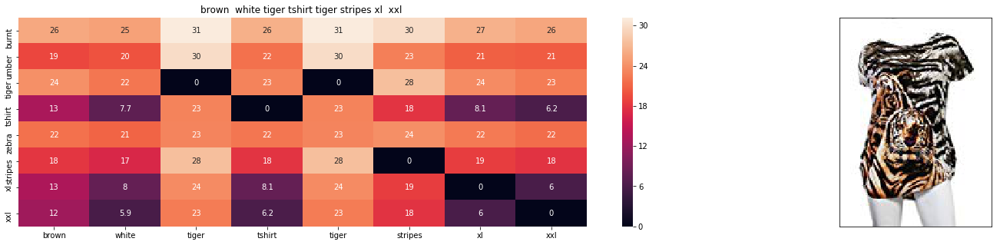

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.741765577142889


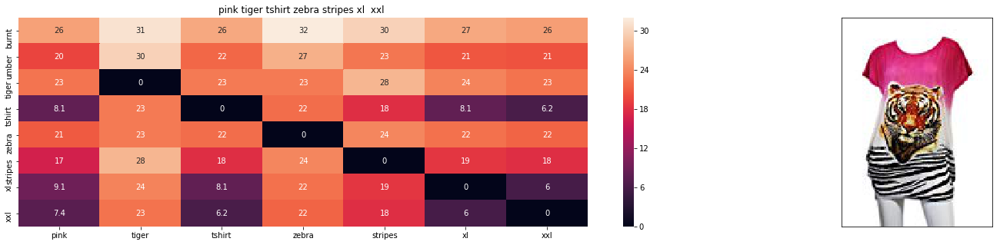

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 3.6753638184104664


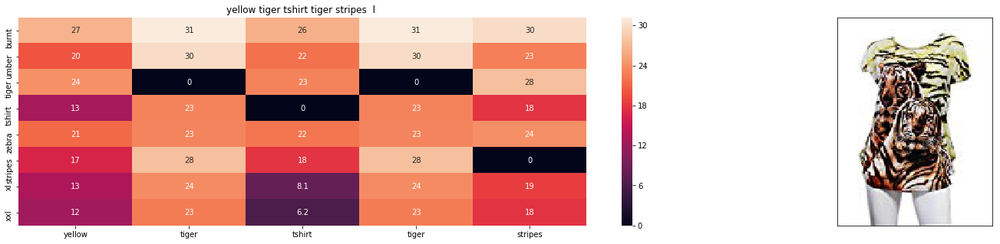

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 3.9252151839333713


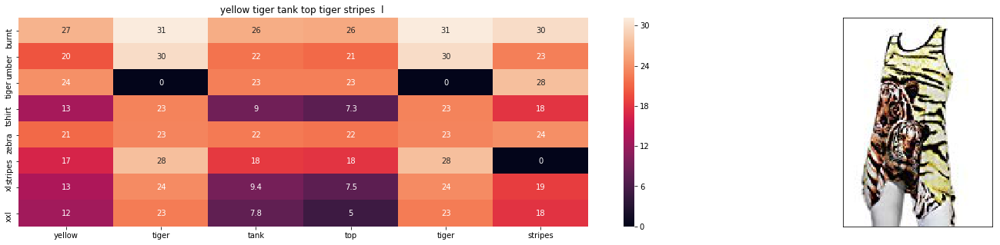

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 3.975122209357288


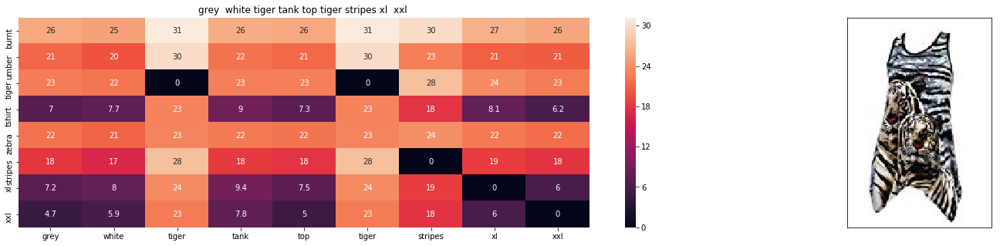

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 3.9804989384555216


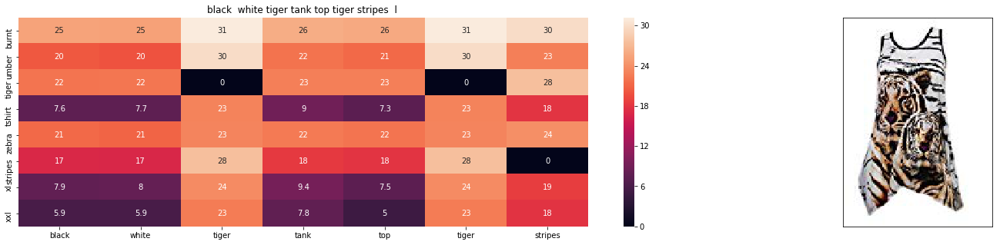

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 4.05484587962318


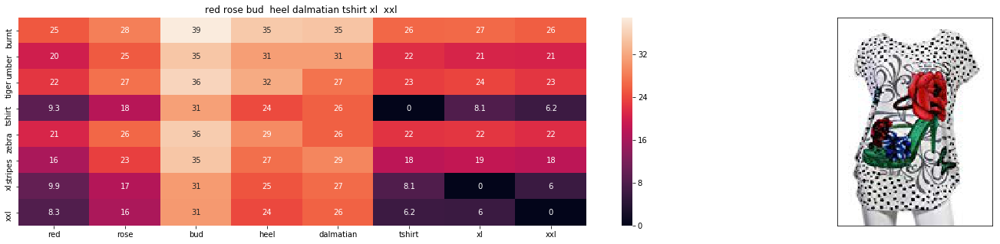

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 4.123025270270374


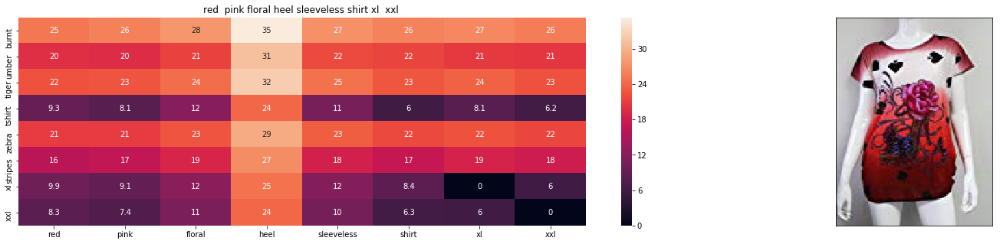

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.154981301376109


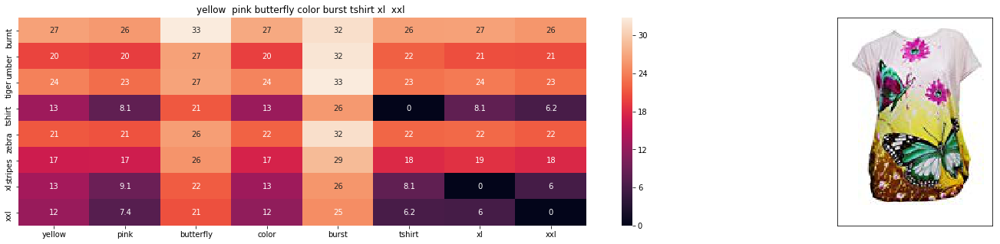

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.172482681602938


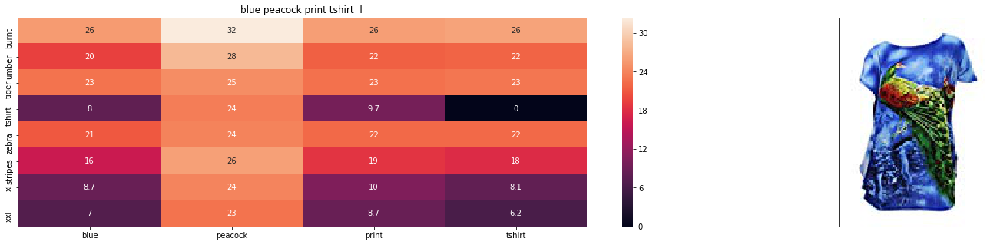

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 4.216252067200861


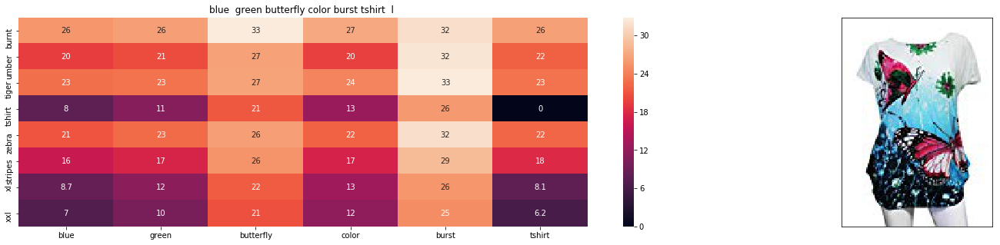

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 4.220183945030672


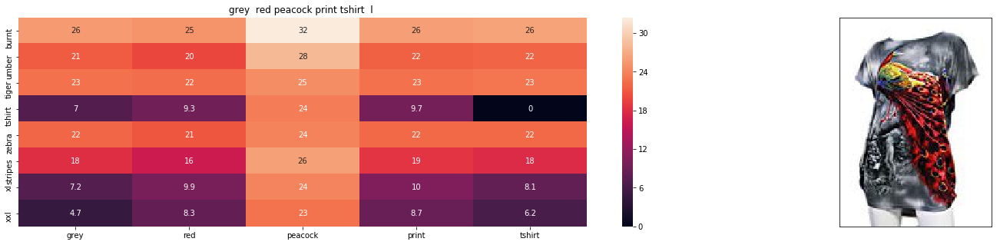

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.265929690602849


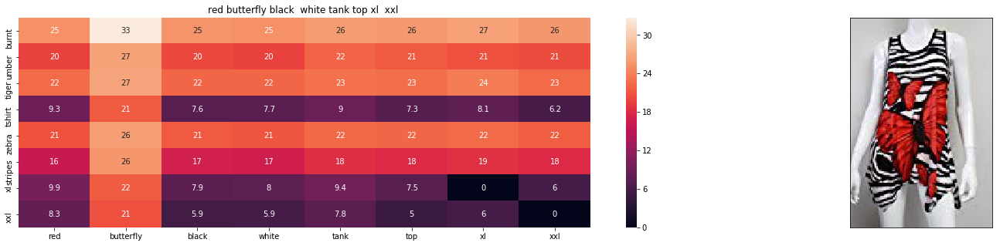

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.300107644149547


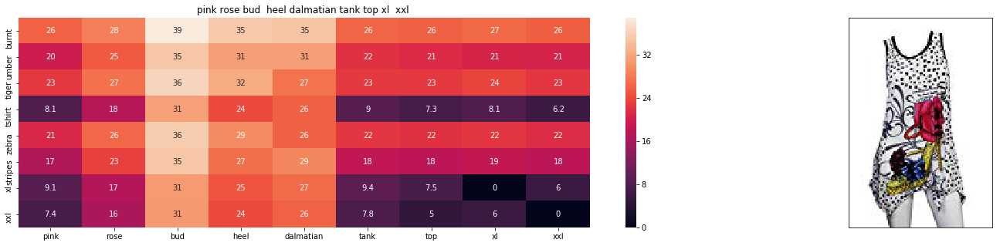

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 4.334806026440473


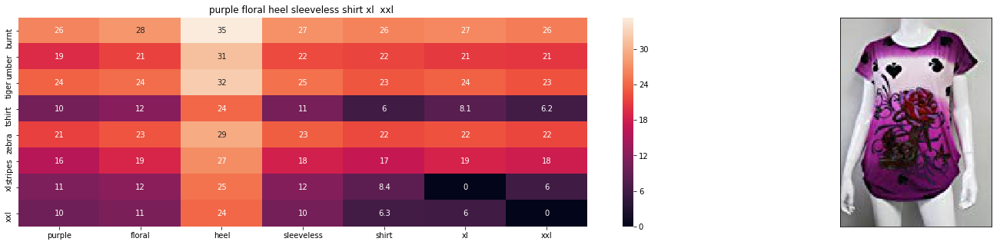

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 4.347103570052867


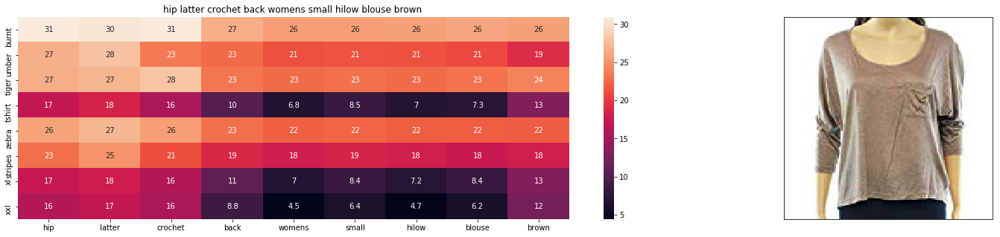

ASIN : B074MJN1K9
Brand : Hip
euclidean distance from input : 4.480308823650377


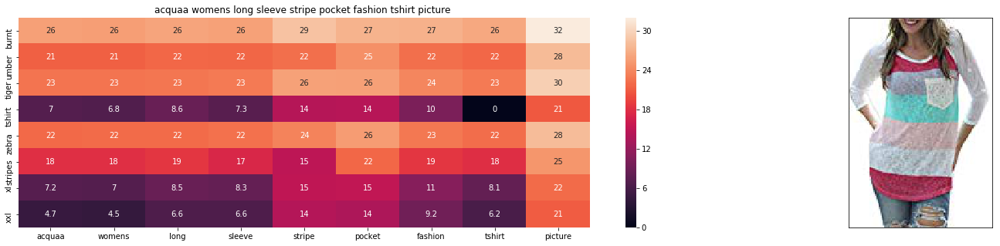

ASIN : B06XK2ZRFH
Brand : Acquaa
euclidean distance from input : 4.579421543232843


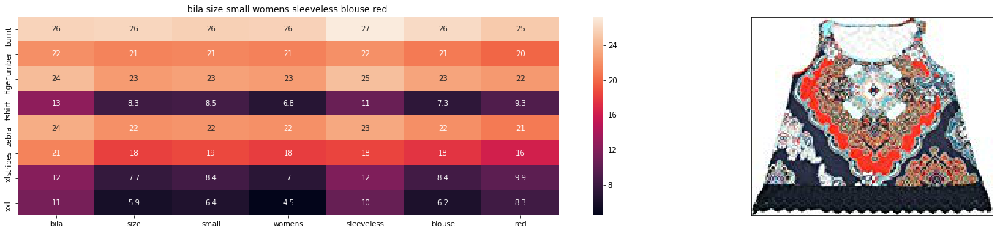

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 4.616074169116336


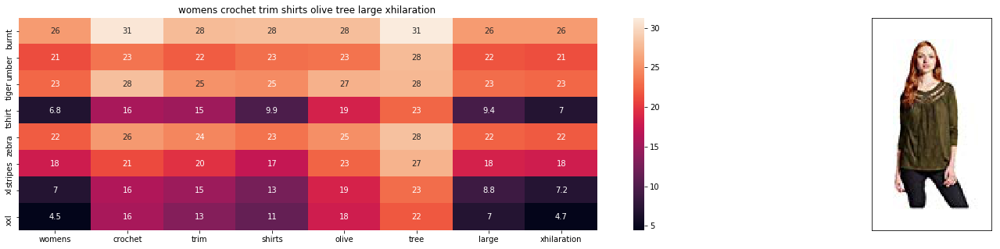

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 4.622177471471146


In [29]:
idf_w2v_brand(12566, 5, 100, 5, 20)

### Giving more weight to idf feature:

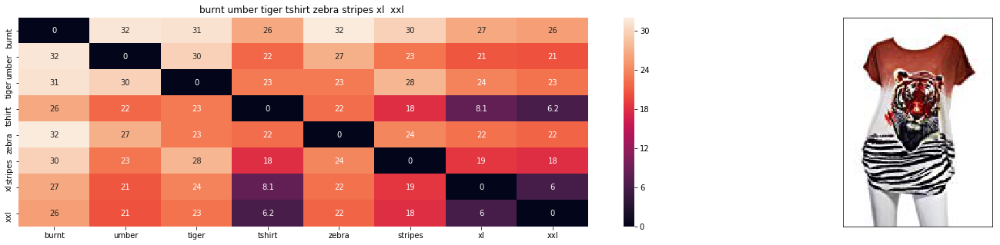

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0035511363636363635


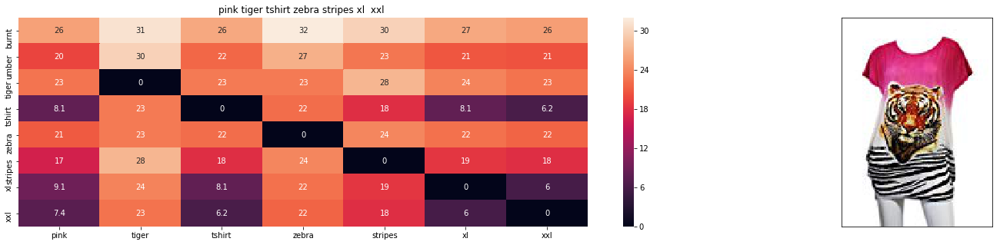

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 5.963718691755596


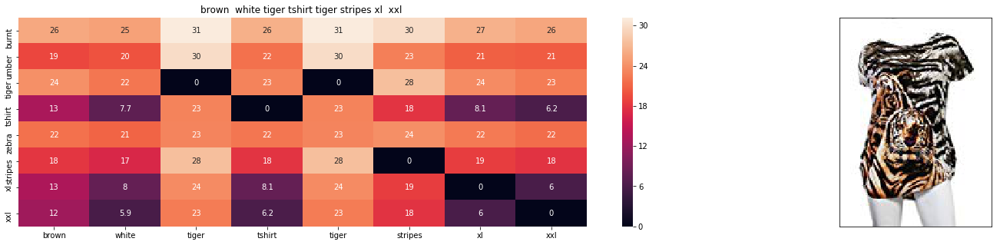

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 6.862124633789063


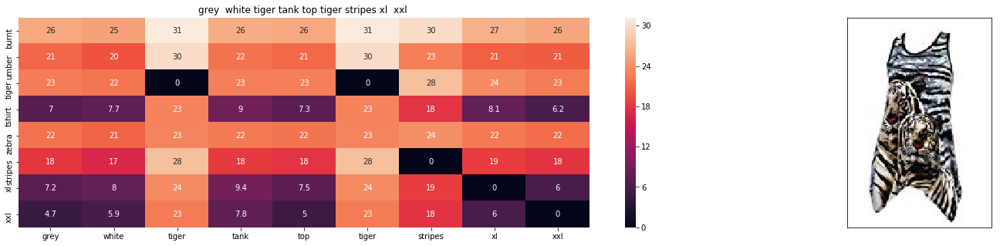

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 7.388362745821647


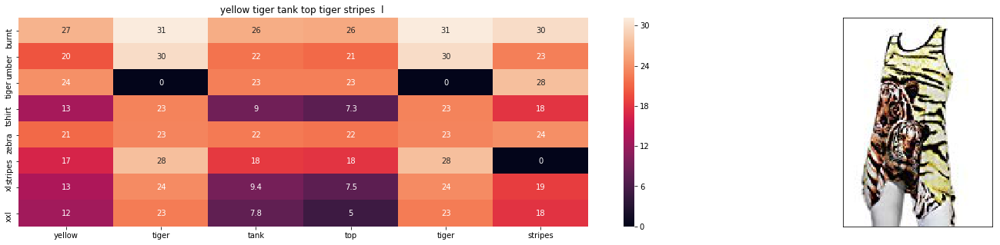

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 7.667435177906164


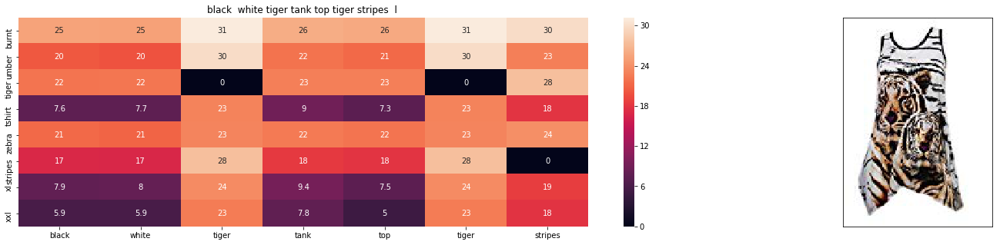

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 7.750180816666817


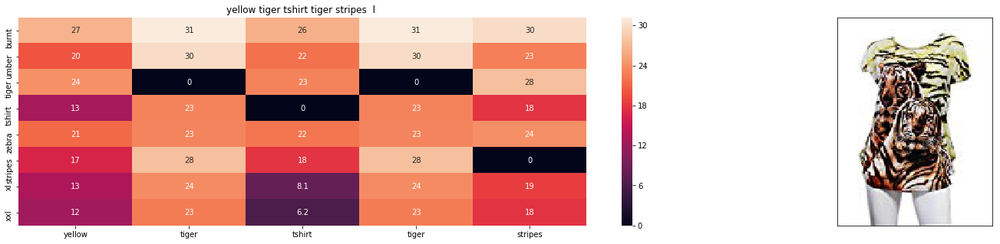

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 7.793640067377044


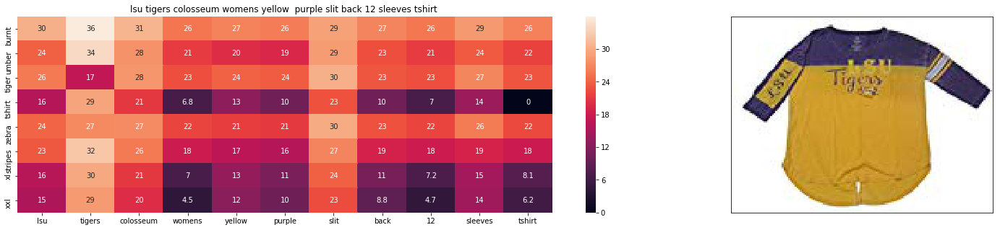

ASIN : B073R5Q8HD
Brand : Colosseum
euclidean distance from input : 8.059213227651373


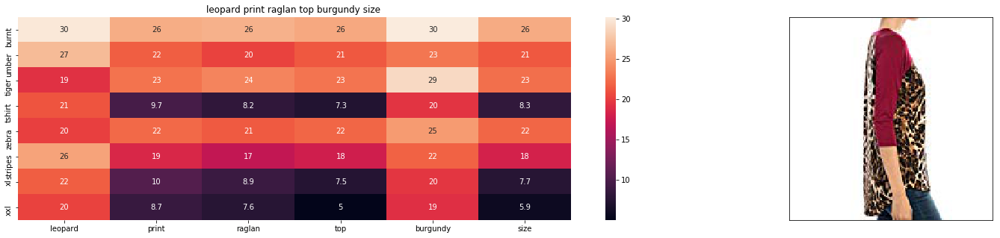

ASIN : B01C6ORLDQ
Brand : 1 Mad Fit
euclidean distance from input : 8.456826088678094


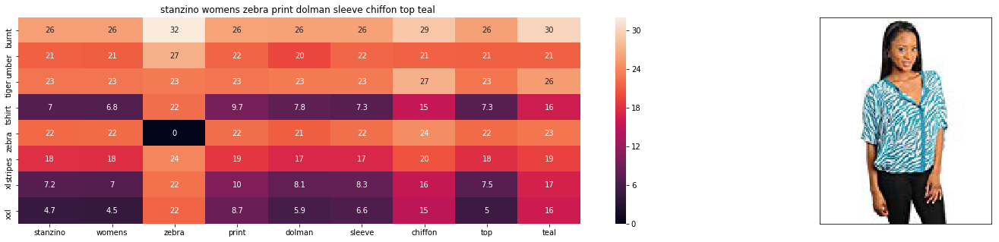

ASIN : B00C0I3U3E
Brand : Stanzino
euclidean distance from input : 8.517274307196828


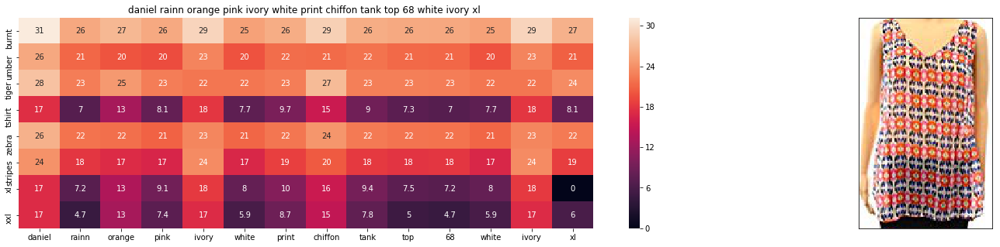

ASIN : B01IPV1SFQ
Brand : Daniel Rainn
euclidean distance from input : 8.535964688387784


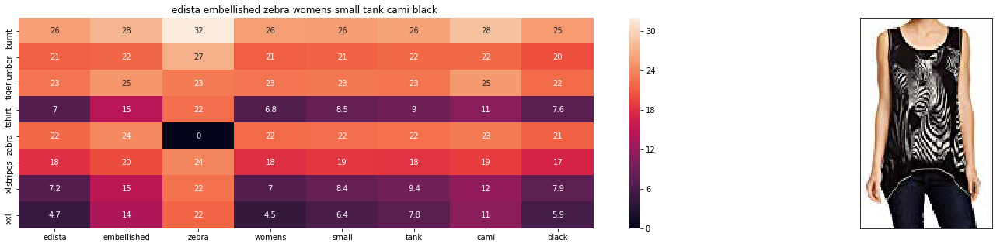

ASIN : B074P8MD22
Brand : Edista
euclidean distance from input : 8.550865005439016


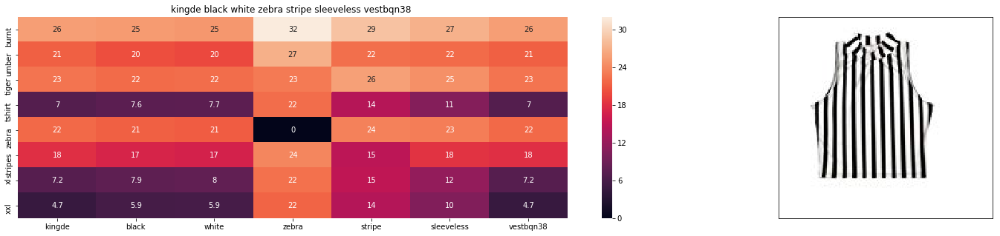

ASIN : B015H41F6G
Brand : KINGDE
euclidean distance from input : 8.557332789973817


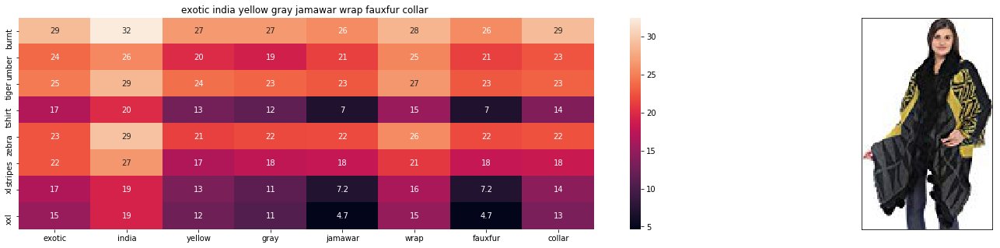

ASIN : B073ZHRBV8
Brand : Exotic India
euclidean distance from input : 8.571196816217157


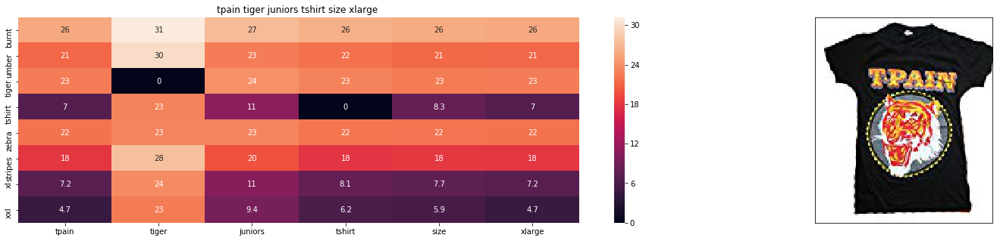

ASIN : B01K0H02OG
Brand : Tultex
euclidean distance from input : 8.591894779497965


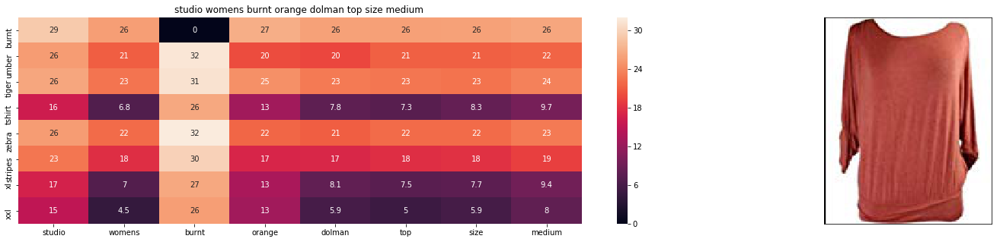

ASIN : B06XSCVFT5
Brand : Studio M
euclidean distance from input : 8.618660944191234


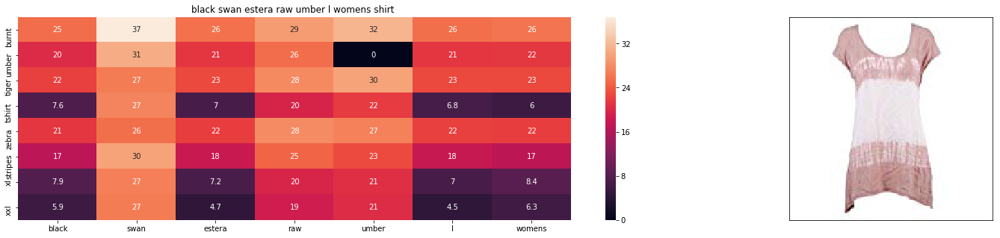

ASIN : B06Y1VN8WQ
Brand : Black Swan
euclidean distance from input : 8.61917891068892


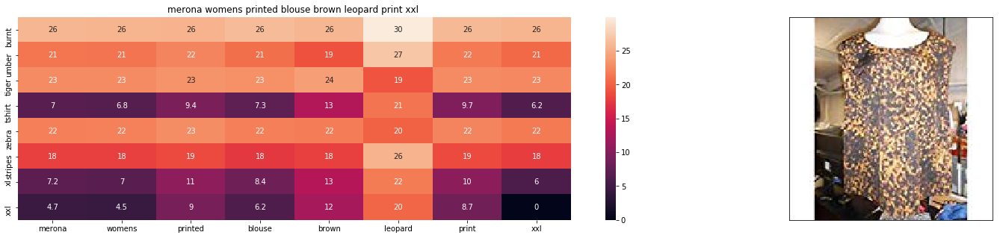

ASIN : B071YF3WDD
Brand : Merona
euclidean distance from input : 8.625226355758619


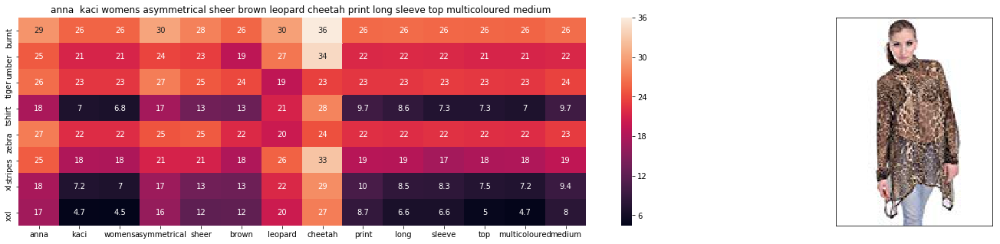

ASIN : B00KSNTY7Y
Brand : Anna-Kaci
euclidean distance from input : 8.640583523869855


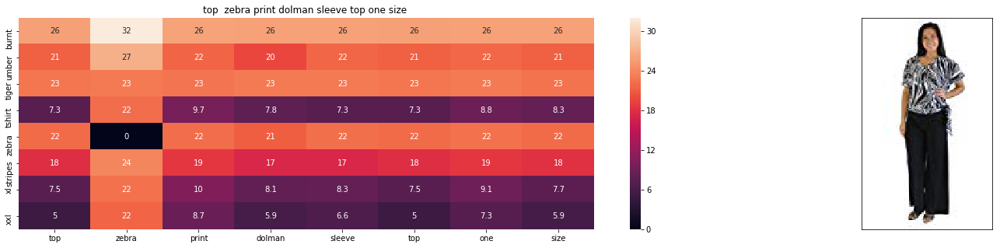

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from input : 8.642265042424542


In [31]:
idf_w2v_brand(12566, 100, 5, 5, 20)

### Giving more weight to Images:

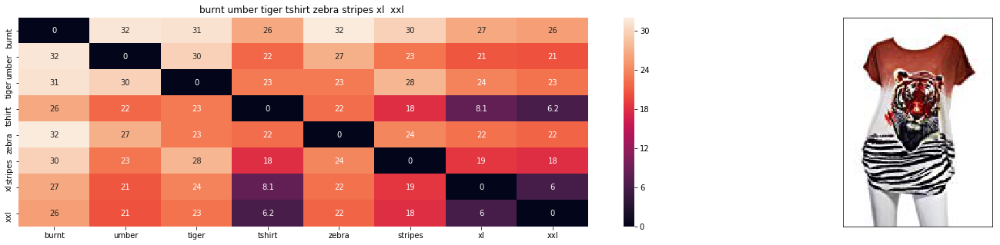

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0001775568181818182


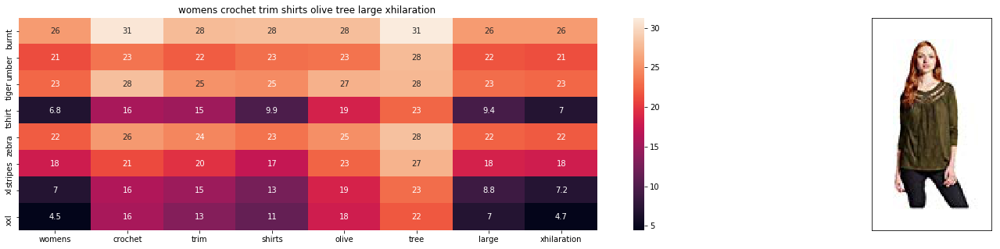

ASIN : B06XBHNM7J
Brand : Xhilaration
euclidean distance from input : 34.29619633071023


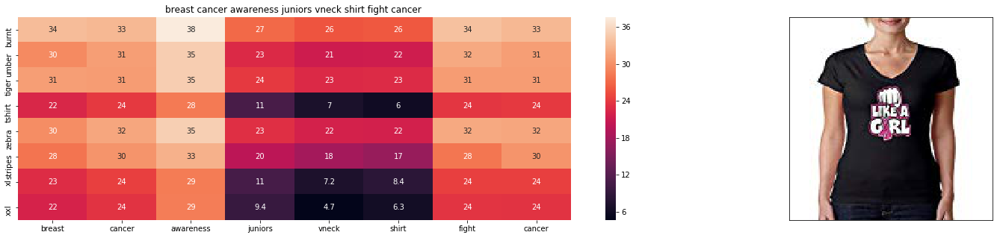

ASIN : B016CU40IY
Brand : Juiceclouds
euclidean distance from input : 35.50357087424672


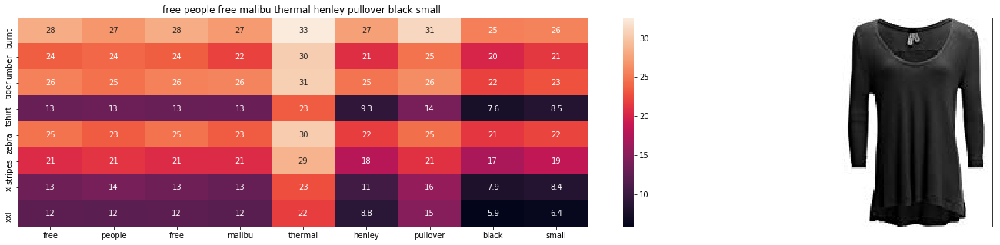

ASIN : B074MXY984
Brand : We The Free
euclidean distance from input : 36.305192947387695


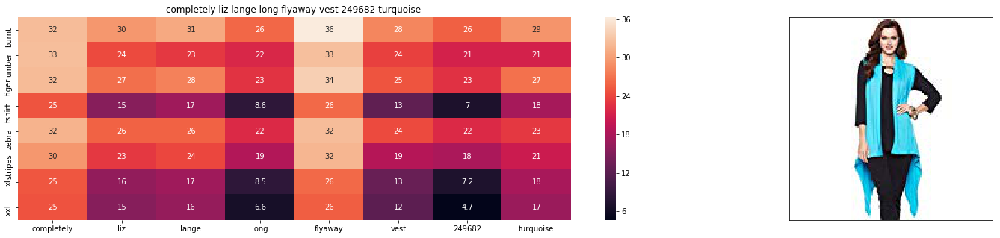

ASIN : B074LTBWSW
Brand : Liz Lange
euclidean distance from input : 36.30866362835095


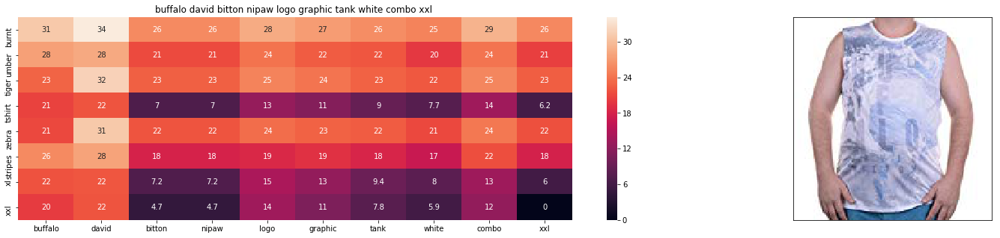

ASIN : B018H5AZXQ
Brand : Buffalo
euclidean distance from input : 36.431408448685644


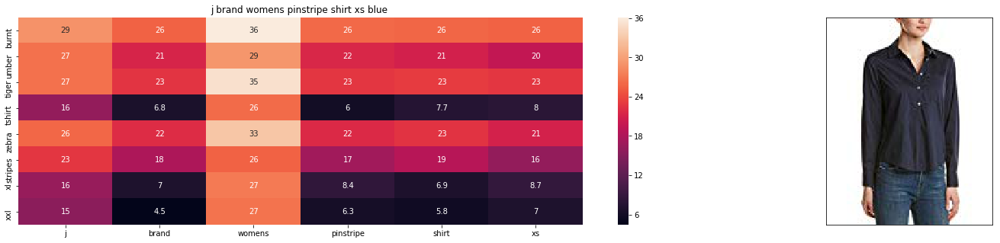

ASIN : B06XYP1X1F
Brand : J Brand Jeans
euclidean distance from input : 36.50396980198031


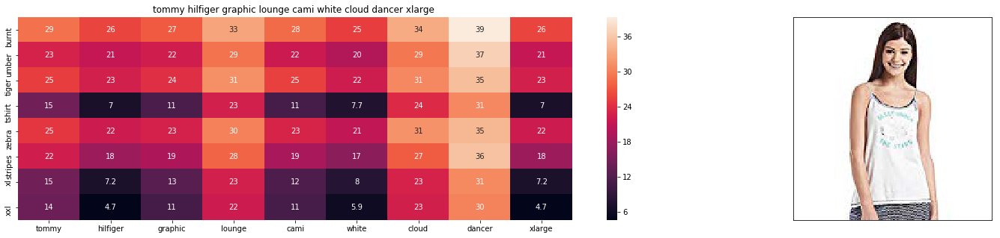

ASIN : B01BMSFYW2
Brand : igertommy hilf
euclidean distance from input : 36.67191885427079


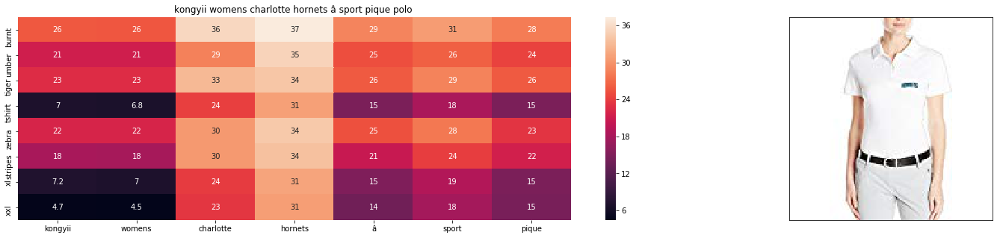

ASIN : B01FJVZST2
Brand : KONGYII
euclidean distance from input : 37.567214624524155


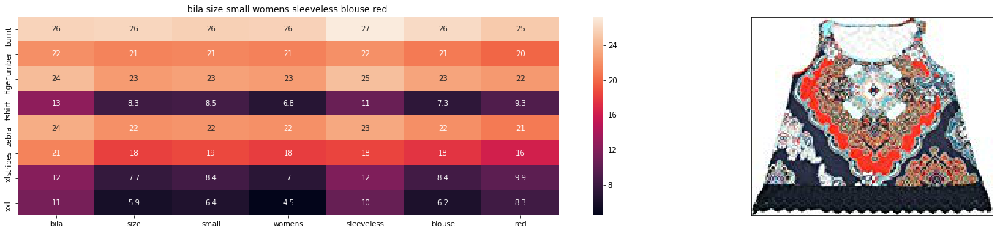

ASIN : B01L7ROZNC
Brand : Bila
euclidean distance from input : 37.7716649890705


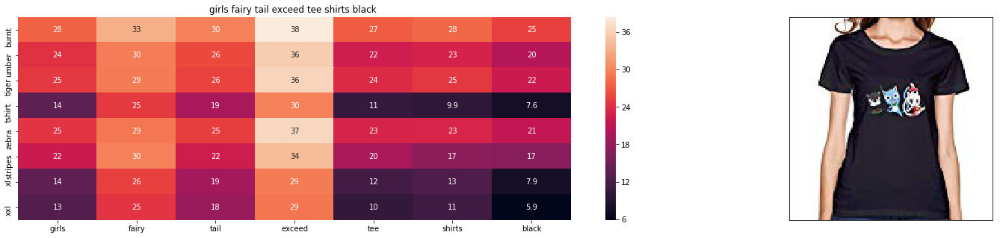

ASIN : B01L9F153U
Brand : ATYPEMX
euclidean distance from input : 38.32847807306597


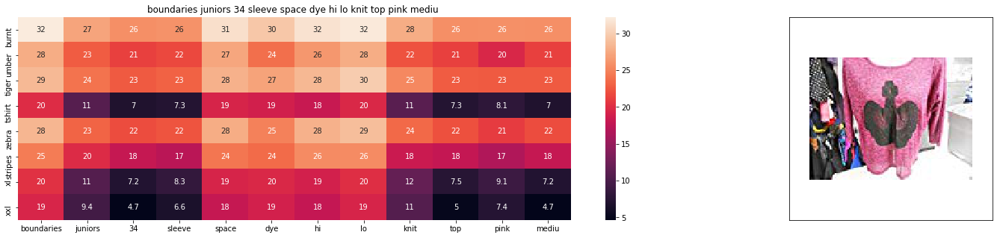

ASIN : B01EXXFS4M
Brand : No Boundaries
euclidean distance from input : 38.40023914687234


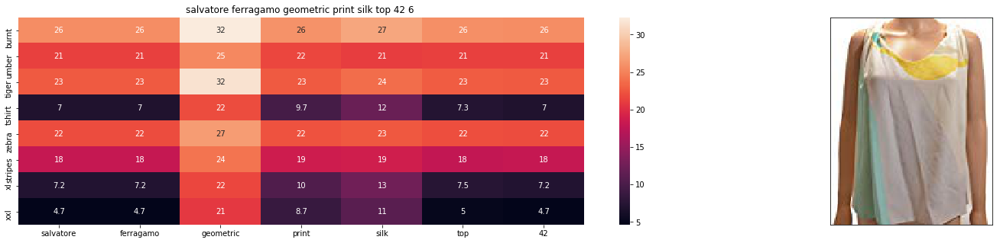

ASIN : B0756JTS1F
Brand : Salvatore Ferragamo
euclidean distance from input : 38.57223808982155


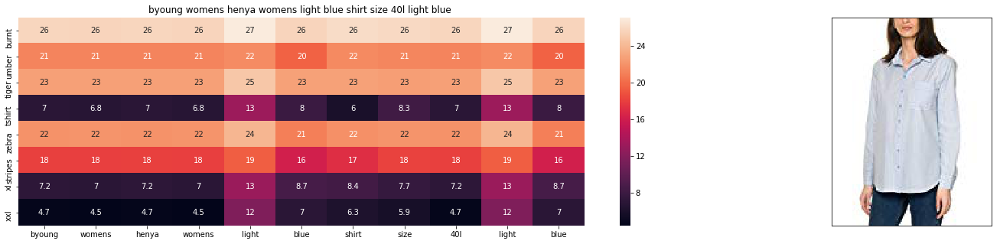

ASIN : B06Y41MRCH
Brand : Byoung
euclidean distance from input : 38.63042269623313


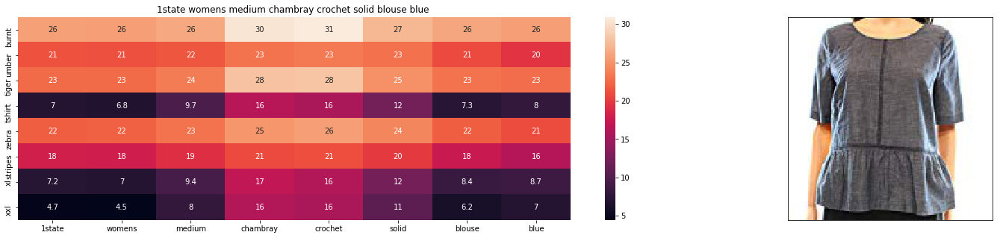

ASIN : B074MK6LV2
Brand : 1.State
euclidean distance from input : 38.714913217663806


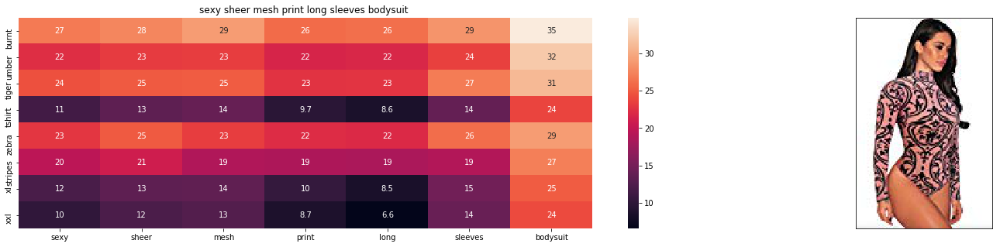

ASIN : B074Z5C98D
Brand : Ariella's closet
euclidean distance from input : 38.77609566585245


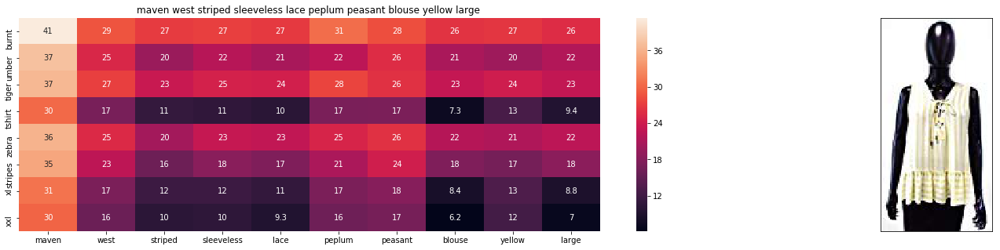

ASIN : B01M8GB3AL
Brand : Maven West
euclidean distance from input : 38.991438466885214


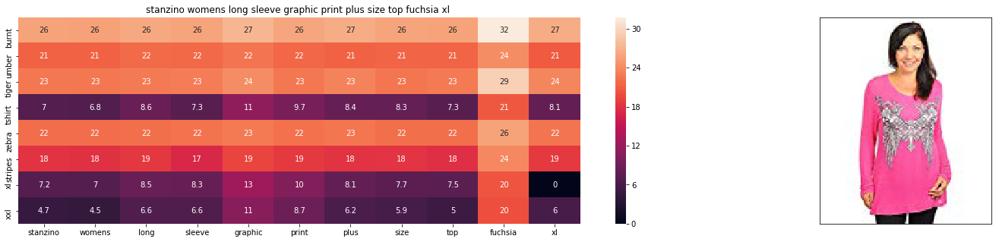

ASIN : B00DP4VHWI
Brand : Stanzino
euclidean distance from input : 38.99582922357867


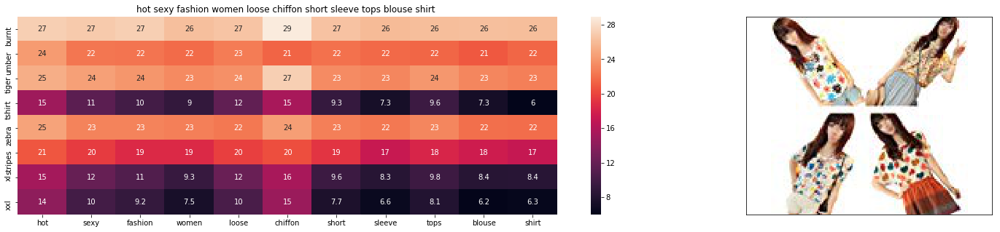

ASIN : B00JMAASRO
Brand : Wotefusi
euclidean distance from input : 39.037474308306564


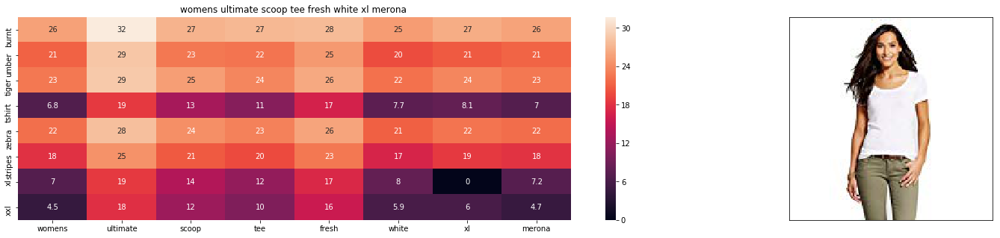

ASIN : B01G7XE50E
Brand : Merona
euclidean distance from input : 39.0519254565998


In [32]:
idf_w2v_brand(12566, 5, 5, 100, 20)

# Conclusion:


1] After experimenting with different models we get to know that idf features perform well in recommending the apparel.<br>
2] Then we combined all the 3 features and by giving individual weights to each feature we get to know that by giving more weight to the extra features like brand and colour the model performed well.<br>